In [1]:
import matplotlib.pyplot as plt
import movecolumn as mc
import numpy as np
import optuna
import pandas as pd
import seaborn as sns
import torch
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from torch import nn
from torch import optim
from torch.utils.data import TensorDataset, DataLoader
from tqdm import tqdm

plt.rcParams['figure.figsize'] = [14, 3]


# Предобработка данных

Dataset from: https://github.com/itmo-ml-lab-ML-course/parser-imorda

In [2]:
raw_df = pd.read_csv('data/result.csv')
raw_df

,Unnamed: 0,name,body_type,modification_name,price_min,price_max,country,classe,doors_count,seats_count,...,engine_max_power_rpm,engine_max_torque,engine_max_torque_rpm,engine_cylinders_position,engine_cylinders_count,engine_valves_per_cylinder,engine_intake_type,engine_compression,engine_cylinder_diameter,engine_piston_stroke
0,0,Nissan Gloria X (Y33),Седан,2.0 AT,-1,-1,Япония,E,4,5,...,6000,167,3200,V-образное,6,-1,распределенный впрыск (многоточечный),10.0,78.0,70.0
1,1,Nissan Gloria X (Y33),Седан,2.5 AT,230000,230000,Япония,E,4,5,...,6400,235,4000,V-образное,6,4,распределенный впрыск (многоточечный),10.0,85.0,73.0
2,2,Nissan Gloria X (Y33),Седан,2.5 AT,-1,-1,Япония,E,4,5,...,6400,275,4800,рядное,6,4,распределенный впрыск (многоточечный),10.0,86.0,72.0
3,3,Nissan Gloria X (Y33),Седан,3.0 AT,-1,-1,Япония,E,4,5,...,5200,248,3200,V-образное,6,2,распределенный впрыск (многоточечный),9.0,87.0,83.0
4,4,Nissan Gloria X (Y33),Седан,3.0 AT,-1,-1,Япония,E,4,5,...,6000,368,3600,V-образное,6,4,непосредственный впрыск (прямой),9.0,87.0,83.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58279,58279,Toyota Avensis I Рестайлинг,Лифтбек,2.0 AT,-1,-1,Япония,D,5,5,...,5700,200,4000,рядное,4,4,распределенный впрыск (многоточечный),9.0,86.0,86.0
58280,58280,Toyota Avensis II,Седан,2.2 MT,-1,-1,Япония,D,4,5,...,3600,310,2000,рядное,4,4,Common rail (Дизель),16.8,86.0,96.0
58281,58281,Toyota Avensis II,Лифтбек,1.8 AT,-1,-1,Япония,D,5,5,...,6000,170,4200,рядное,4,4,распределенный впрыск (многоточечный),10.0,79.0,91.5
58282,58282,Toyota Avensis II,Седан,2.2 MT,-1,-1,Япония,D,4,5,...,3600,310,2000,рядное,4,4,Common rail (Дизель),16.8,86.0,96.0


Кайф, 54 параметра. Предстоит найти в них небесполезные признаки....

Попробуем предсказывать цену автомобиля по его каталожным параметрам

<Axes: >

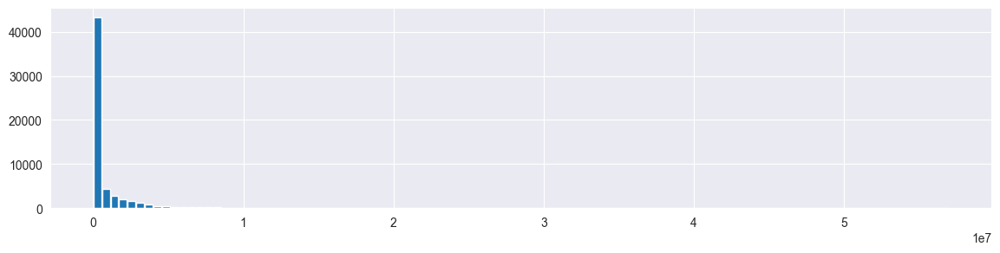

In [3]:
raw_df.price_min.hist(bins=100, rwidth=0.9)

Для начала потрём данные, в которых нет цены, так как её и будем предсказывать (как в train, так и в test выборке нужна цена, надо же как-то что-то валидировать

Замечание: как price_min так и price_max могут быть страшными выбросами, так как низ рынка, как и верх иногда могут неоправдано улетать в космос. Хочется взять медиану рынка, но у нас всего 2 признака (мин и макс). Что ж, остаётся только взять среднее, чтобы хоть как-то с этим справиться.


<Axes: >

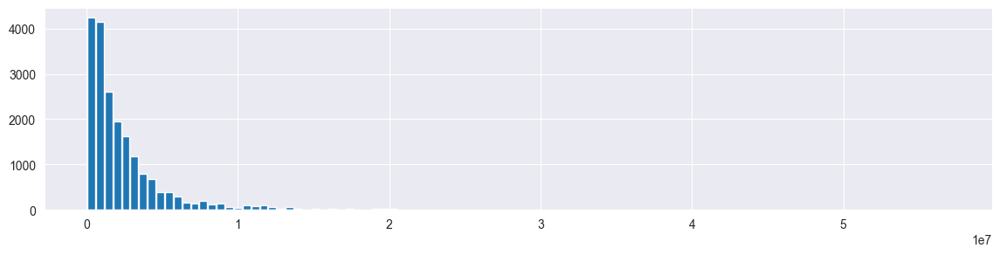

In [4]:
raw_df['price_avg'] = raw_df.price_min + (raw_df.price_max - raw_df.price_min) / 2.

df = raw_df[(raw_df.price_min > 0) &
            (raw_df.price_max > 0) &
            (raw_df.doors_count > 0)]
df.price_avg.hist(bins=100, rwidth=0.9)

In [5]:
df

,Unnamed: 0,name,body_type,modification_name,price_min,price_max,country,classe,doors_count,seats_count,...,engine_max_torque,engine_max_torque_rpm,engine_cylinders_position,engine_cylinders_count,engine_valves_per_cylinder,engine_intake_type,engine_compression,engine_cylinder_diameter,engine_piston_stroke,price_avg
1,1,Nissan Gloria X (Y33),Седан,2.5 AT,230000,230000,Япония,E,4,5,...,235,4000,V-образное,6,4,распределенный впрыск (многоточечный),10.0,85.0,73.0,230000.0
9,9,Nissan Gloria X (Y33),Седан,2.8 AT,820000,820000,Япония,E,4,5,...,181,2400,рядное,6,2,ТНВД (Дизель),22.0,85.0,83.0,820000.0
60,60,Nissan Gloria XI (Y34),Седан,3.0 AT,510000,510000,Япония,E,4,5,...,387,3600,V-образное,6,4,непосредственный впрыск (прямой),9.0,87.0,83.0,510000.0
63,63,Nissan Gloria XI (Y34),Седан,3.0 CVT,510000,510000,Япония,E,4,5,...,387,3600,V-образное,6,4,непосредственный впрыск (прямой),9.0,87.0,83.0,510000.0
64,64,Nissan Gloria XI (Y34),Седан,2.5 AT,548000,690000,Япония,E,4,5,...,265,4400,V-образное,6,4,непосредственный впрыск (прямой),11.0,85.0,73.0,619000.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58264,58264,Toyota Avensis II,Седан,1.8 AT,600000,600000,Япония,D,4,5,...,170,4200,рядное,4,4,распределенный впрыск (многоточечный),10.0,79.0,91.5,600000.0
58266,58266,Toyota Avensis II,Седан,2.0 MT,610000,610000,Япония,D,4,5,...,196,4000,рядное,4,4,непосредственный впрыск (прямой),11.0,86.0,86.0,610000.0
58267,58267,Toyota Avensis II,Седан,2.0 AT,610000,610000,Япония,D,4,5,...,196,4000,рядное,4,4,непосредственный впрыск (прямой),11.0,86.0,86.0,610000.0
58268,58268,Toyota Avensis II,Седан,1.8 MT,600000,600000,Япония,D,4,5,...,170,4200,рядное,4,4,распределенный впрыск (многоточечный),10.0,79.0,91.5,600000.0


Слишком большой разброс цен, ничего не видно. Окэй, логарифмируем

<Axes: >

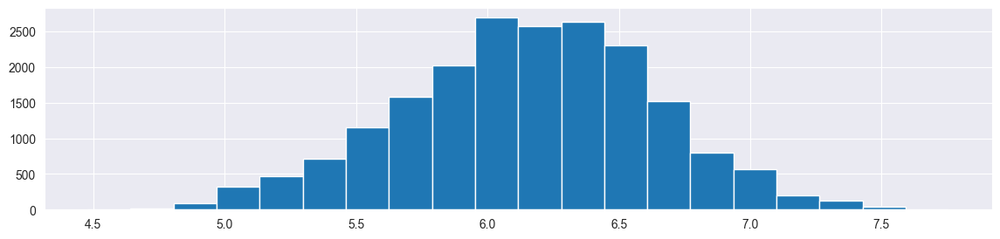

In [6]:
price = df.price_avg
price_log = np.log10(price)
price_log.hist(bins=20)

Omg, это же нормальное распределение, кайф. 
Ну мы поняли, что большинство тачек стоит где-то 1-5 лимонов, супер.

Лан, это вполне возможно предсказывать. 

Теперь задача вытащить из этой свалки полезные фичи...

In [7]:
df.dtypes

Unnamed: 0                      int64
name                           object
body_type                      object
modification_name              object
price_min                       int64
price_max                       int64
country                        object
classe                         object
doors_count                     int64
seats_count                     int64
steering_wheel_side            object
front_suspension_type          object
rear_suspension_type           object
front_brakes_type              object
rear_brakes_type               object
length                          int64
width                           int64
height                          int64
wheelbase                       int64
clearance                       int64
front_track                     int64
rear_track                      int64
max_speed                       int64
zero_to_100                   float64
fuel_consumption_city         float64
fuel_consumption_road         float64
fuel_consump

В целом, можно парсить и onehotить имя, вытаскивая название марки. Всякие мерседесы ожидаются быть более дорогими, чем ВАЗ. Однако, это довольно тупая фича получается, так как мы не можем ограничиться парой марок, лучше смотреть на более прямые признаки (например, класс автомобиля, который в свою очередь не помешает отonehotить)

In [8]:
processed_df = pd.DataFrame()

### Численные признаки

#### Количество дверей

<Axes: >

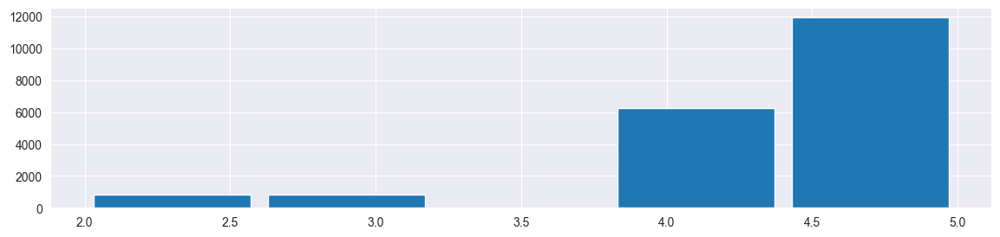

In [9]:
processed_df['doors_count'] = df.doors_count
processed_df.doors_count.hist(bins=5, rwidth=0.9)

#### Количество мест

<Axes: >

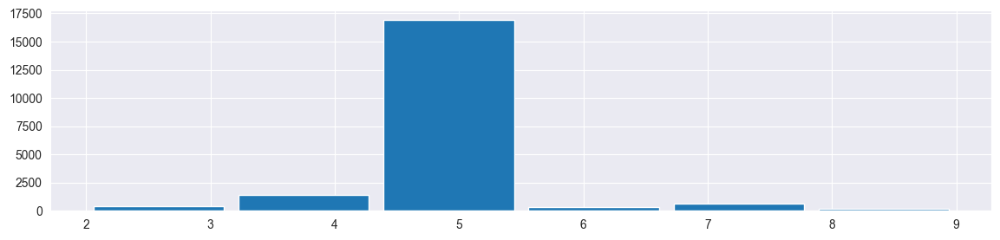

In [10]:
processed_df['seats_count'] = df.seats_count
processed_df.seats_count.hist(bins=6, rwidth=0.9)

#### Длина

<Axes: >

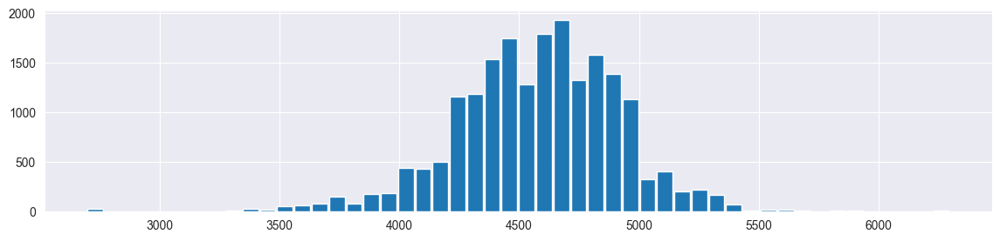

In [11]:
processed_df['length'] = df.length
processed_df.length.hist(bins=50, rwidth=0.9)

#### Ширина

<Axes: >

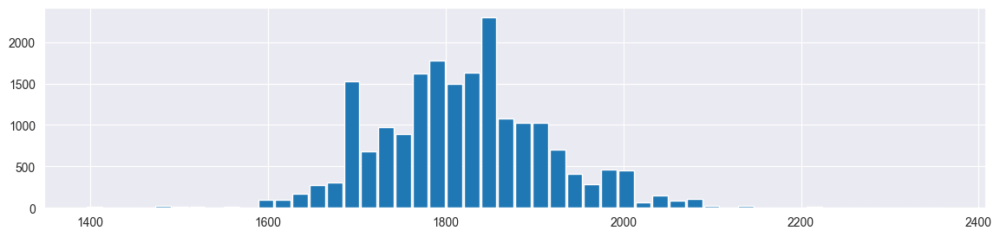

In [12]:
processed_df['width'] = df.width
processed_df.width.hist(bins=50, rwidth=0.9)

#### Высота

<Axes: >

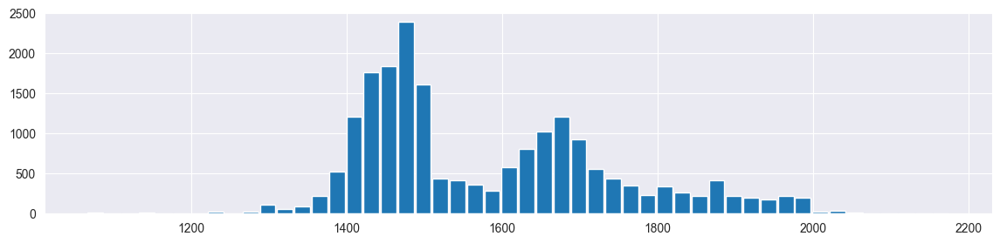

In [13]:
processed_df['height'] = df.height
processed_df.height.hist(bins=50, rwidth=0.9)

#### Колёсная база

<Axes: >

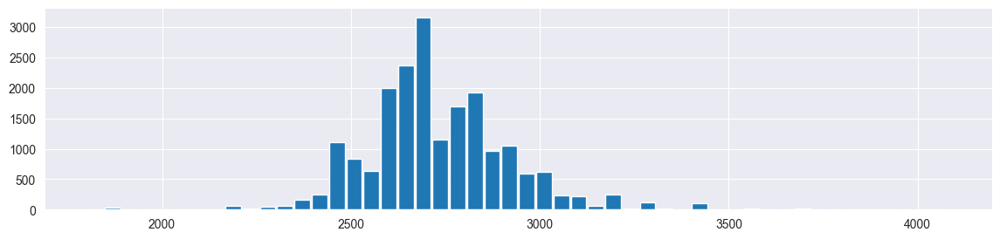

In [14]:
processed_df['wheelbase'] = df.wheelbase
processed_df.wheelbase.hist(bins=50, rwidth=0.9)

#### Клиренс

<Axes: >

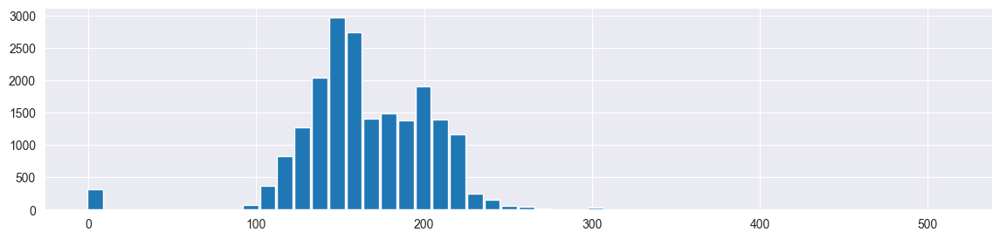

In [15]:
processed_df['clearance'] = df.clearance
processed_df.clearance.hist(bins=50, rwidth=0.9)

#### Передняя колея

<Axes: >

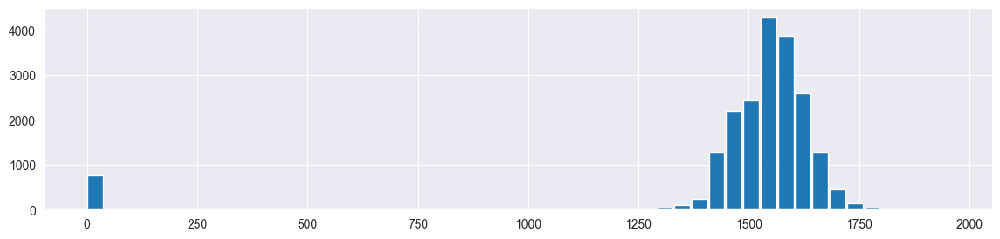

In [16]:
processed_df['front_track'] = df.front_track
processed_df.front_track.hist(bins=50, rwidth=0.9)

#### Задняя колея

<Axes: >

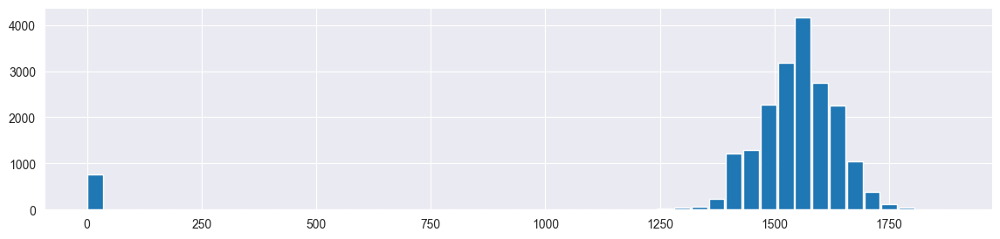

In [17]:
processed_df['rear_track'] = df.rear_track
processed_df.rear_track.hist(bins=50, rwidth=0.9)

#### Максимальная скорость

<Axes: >

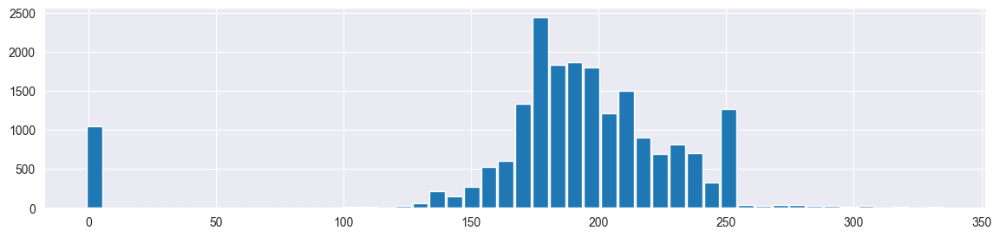

In [18]:
processed_df['max_speed'] = df.max_speed
processed_df.max_speed.hist(bins=50, rwidth=0.9)

#### Разгон до 100

<Axes: >

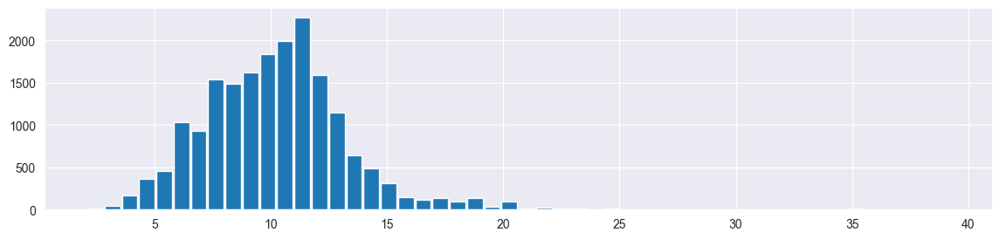

In [19]:
processed_df['zero_to_100'] = df.zero_to_100
processed_df.zero_to_100.hist(bins=50, rwidth=0.9)

#### Смешанный расход топлива

<Axes: >

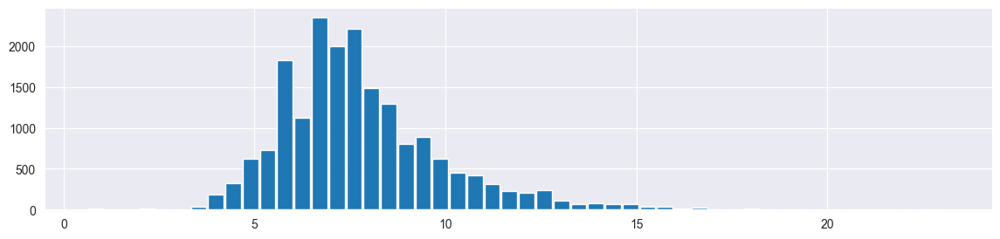

In [20]:
processed_df['fuel_consumption_mixed'] = df.fuel_consumption_mixed
processed_df.fuel_consumption_mixed.hist(bins=50, rwidth=0.9)

#### Объём двигателя

<Axes: >

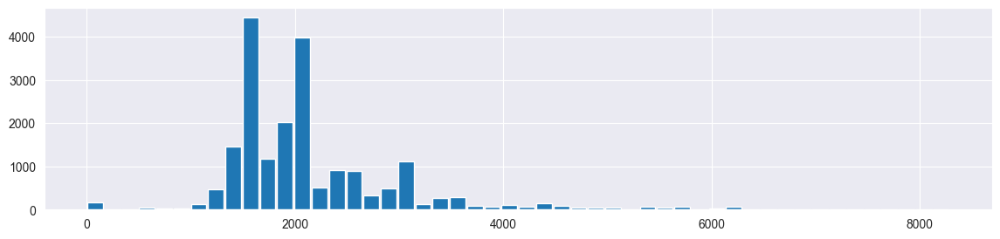

In [21]:
processed_df['engine_displacement'] = df.engine_displacement
processed_df.engine_displacement.hist(bins=50, rwidth=0.9)

#### Мощность двигателя

<Axes: >

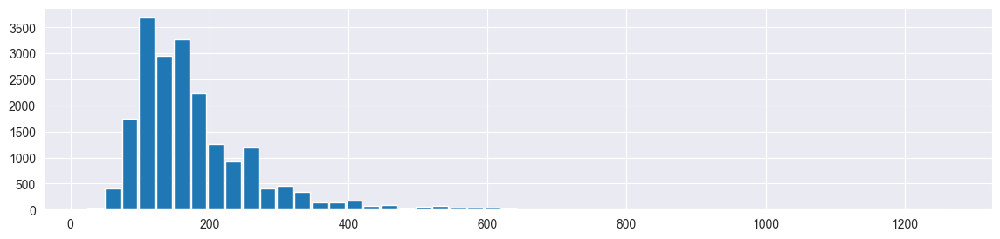

In [22]:
processed_df['engine_max_horsepower'] = df.engine_max_horsepower
processed_df.engine_max_horsepower.hist(bins=50, rwidth=0.9)

#### Крутящий момент двигателя

<Axes: >

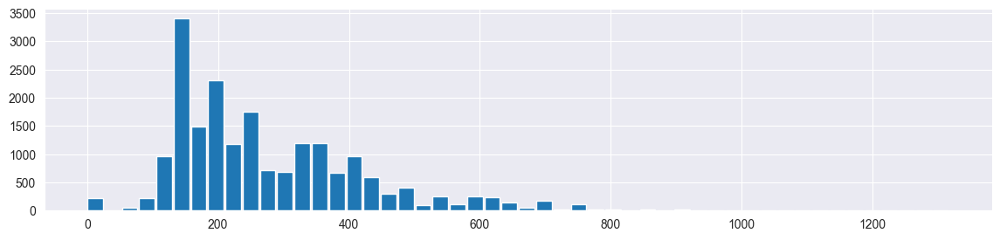

In [23]:
processed_df['engine_max_torque'] = df.engine_max_torque
processed_df.engine_max_torque.hist(bins=50, rwidth=0.9)

#### Количество цилиндров в двигателе

<Axes: >

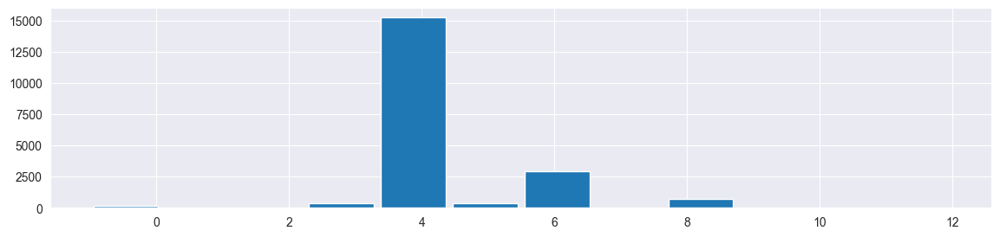

In [24]:
processed_df['engine_cylinders_count'] = df.engine_cylinders_count
processed_df.engine_cylinders_count.hist(bins=12, rwidth=0.9)

#### Средняя цена

<Axes: >

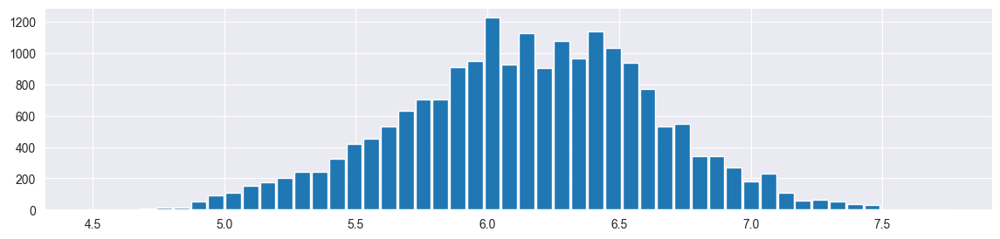

In [25]:
processed_df['price_avg'] = price_log
processed_df.price_avg.hist(bins=50, rwidth=0.9)

### Target

#### Тип привода

Тут хотим сделать label encoding, чтобы сделать из этого признака target. Хорошо ложится на kNN, где не бывает промежуточных значений результата

In [26]:
le = LabelEncoder()
le.fit(df.drive_type)
le.classes_

array(['задний', 'передний', 'полный'], dtype=object)

In [27]:
processed_df['target'] = le.transform(df.drive_type)
processed_df

,doors_count,seats_count,length,width,height,wheelbase,clearance,front_track,rear_track,max_speed,zero_to_100,fuel_consumption_mixed,engine_displacement,engine_max_horsepower,engine_max_torque,engine_cylinders_count,price_avg,target
1,4,5,4860,1720,1425,2735,145,1440,1450,-1,NaN,9.0,2495,190,235,6,5.361728,0
9,4,5,4860,1720,1425,2735,145,1440,1450,-1,NaN,NaN,2825,100,181,6,5.913814,0
60,4,5,4865,1770,1180,2800,140,1510,1510,251,6.8,11.0,2960,280,387,6,5.707570,0
63,4,5,4865,1770,1180,2800,140,1510,1510,245,6.6,11.0,2960,280,387,6,5.707570,0
64,4,5,4865,1770,1180,2800,140,1510,1510,180,8.8,8.5,2495,210,265,6,5.791691,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58264,4,5,4630,1760,1480,2700,150,1505,1510,185,11.6,7.7,1794,129,170,4,5.778151,1
58266,4,5,4630,1760,1480,2700,150,1505,1510,205,9.4,8.0,1998,147,196,4,5.785330,1
58267,4,5,4630,1760,1480,2700,150,1505,1510,195,11.1,9.2,1998,147,196,4,5.785330,1
58268,4,5,4630,1760,1480,2700,150,1505,1510,200,10.3,7.2,1794,129,170,4,5.778151,1


### Категориальные признаки

Здесь мы всё так же применяем One Hot Encoder для выражения категориальных признаков в числовой форме так, чтобы они не были упорядоченными. Здесь мы жертвуем знанием о категориальности признаков, которое можно было бы использовать в самодельной модели Decision Tree. Это не должно ухудшать качество модели, так как число способов выбрать разбиение для модели не изменится, но зато мы сможем привести все признаки к единому виду. Более того, библиотечная модель Decision Tree не способна как-либо по-особенному обрабатывать категориальные данные и также требует их преобразования, например с помощью OneHotEncoder (см. [StackOverflow](https://stackoverflow.com/questions/38108832/passing-categorical-data-to-sklearn-decision-tree))

In [28]:
processed_df

,doors_count,seats_count,length,width,height,wheelbase,clearance,front_track,rear_track,max_speed,zero_to_100,fuel_consumption_mixed,engine_displacement,engine_max_horsepower,engine_max_torque,engine_cylinders_count,price_avg,target
1,4,5,4860,1720,1425,2735,145,1440,1450,-1,NaN,9.0,2495,190,235,6,5.361728,0
9,4,5,4860,1720,1425,2735,145,1440,1450,-1,NaN,NaN,2825,100,181,6,5.913814,0
60,4,5,4865,1770,1180,2800,140,1510,1510,251,6.8,11.0,2960,280,387,6,5.707570,0
63,4,5,4865,1770,1180,2800,140,1510,1510,245,6.6,11.0,2960,280,387,6,5.707570,0
64,4,5,4865,1770,1180,2800,140,1510,1510,180,8.8,8.5,2495,210,265,6,5.791691,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58264,4,5,4630,1760,1480,2700,150,1505,1510,185,11.6,7.7,1794,129,170,4,5.778151,1
58266,4,5,4630,1760,1480,2700,150,1505,1510,205,9.4,8.0,1998,147,196,4,5.785330,1
58267,4,5,4630,1760,1480,2700,150,1505,1510,195,11.1,9.2,1998,147,196,4,5.785330,1
58268,4,5,4630,1760,1480,2700,150,1505,1510,200,10.3,7.2,1794,129,170,4,5.778151,1


#### Класс

In [29]:
processed_df = processed_df.join(pd.get_dummies(df.classe, prefix="classe"))
processed_df = processed_df[processed_df.classe_undefined == False]
processed_df = processed_df.drop('classe_undefined', axis=1)
processed_df

,doors_count,seats_count,length,width,height,wheelbase,clearance,front_track,rear_track,max_speed,...,target,classe_A,classe_B,classe_C,classe_D,classe_E,classe_F,classe_J,classe_M,classe_S
1,4,5,4860,1720,1425,2735,145,1440,1450,-1,...,0,False,False,False,False,True,False,False,False,False
9,4,5,4860,1720,1425,2735,145,1440,1450,-1,...,0,False,False,False,False,True,False,False,False,False
60,4,5,4865,1770,1180,2800,140,1510,1510,251,...,0,False,False,False,False,True,False,False,False,False
63,4,5,4865,1770,1180,2800,140,1510,1510,245,...,0,False,False,False,False,True,False,False,False,False
64,4,5,4865,1770,1180,2800,140,1510,1510,180,...,0,False,False,False,False,True,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58264,4,5,4630,1760,1480,2700,150,1505,1510,185,...,1,False,False,False,True,False,False,False,False,False
58266,4,5,4630,1760,1480,2700,150,1505,1510,205,...,1,False,False,False,True,False,False,False,False,False
58267,4,5,4630,1760,1480,2700,150,1505,1510,195,...,1,False,False,False,True,False,False,False,False,False
58268,4,5,4630,1760,1480,2700,150,1505,1510,200,...,1,False,False,False,True,False,False,False,False,False


#### Тип кузова

In [30]:
df.body_type = df.body_type.apply(lambda x: x.split()[0].strip())
processed_df = processed_df.join(pd.get_dummies(df.body_type, prefix="body_type"))
processed_df

C:\Users\btima\AppData\Local\Temp\ipykernel_48636\3598234286.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.body_type = df.body_type.apply(lambda x: x.split()[0].strip())


,doors_count,seats_count,length,width,height,wheelbase,clearance,front_track,rear_track,max_speed,...,body_type_Микровэн,body_type_Минивэн,body_type_Пикап,body_type_Родстер,body_type_Седан,body_type_Седан-хардтоп,body_type_Тарга,body_type_Универсал,body_type_Фургон,body_type_Хэтчбек
1,4,5,4860,1720,1425,2735,145,1440,1450,-1,...,False,False,False,False,True,False,False,False,False,False
9,4,5,4860,1720,1425,2735,145,1440,1450,-1,...,False,False,False,False,True,False,False,False,False,False
60,4,5,4865,1770,1180,2800,140,1510,1510,251,...,False,False,False,False,True,False,False,False,False,False
63,4,5,4865,1770,1180,2800,140,1510,1510,245,...,False,False,False,False,True,False,False,False,False,False
64,4,5,4865,1770,1180,2800,140,1510,1510,180,...,False,False,False,False,True,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58264,4,5,4630,1760,1480,2700,150,1505,1510,185,...,False,False,False,False,True,False,False,False,False,False
58266,4,5,4630,1760,1480,2700,150,1505,1510,205,...,False,False,False,False,True,False,False,False,False,False
58267,4,5,4630,1760,1480,2700,150,1505,1510,195,...,False,False,False,False,True,False,False,False,False,False
58268,4,5,4630,1760,1480,2700,150,1505,1510,200,...,False,False,False,False,True,False,False,False,False,False


#### Тип двигателя

In [31]:
processed_df = processed_df.join(pd.get_dummies(df.engine_type, prefix="engine_type"))
processed_df

,doors_count,seats_count,length,width,height,wheelbase,clearance,front_track,rear_track,max_speed,...,body_type_Седан-хардтоп,body_type_Тарга,body_type_Универсал,body_type_Фургон,body_type_Хэтчбек,engine_type_ГБО,engine_type_Электро,engine_type_бензиновый,engine_type_гибридный,engine_type_дизельный
1,4,5,4860,1720,1425,2735,145,1440,1450,-1,...,False,False,False,False,False,False,False,True,False,False
9,4,5,4860,1720,1425,2735,145,1440,1450,-1,...,False,False,False,False,False,False,False,False,False,True
60,4,5,4865,1770,1180,2800,140,1510,1510,251,...,False,False,False,False,False,False,False,True,False,False
63,4,5,4865,1770,1180,2800,140,1510,1510,245,...,False,False,False,False,False,False,False,True,False,False
64,4,5,4865,1770,1180,2800,140,1510,1510,180,...,False,False,False,False,False,False,False,True,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58264,4,5,4630,1760,1480,2700,150,1505,1510,185,...,False,False,False,False,False,False,False,True,False,False
58266,4,5,4630,1760,1480,2700,150,1505,1510,205,...,False,False,False,False,False,False,False,True,False,False
58267,4,5,4630,1760,1480,2700,150,1505,1510,195,...,False,False,False,False,False,False,False,True,False,False
58268,4,5,4630,1760,1480,2700,150,1505,1510,200,...,False,False,False,False,False,False,False,True,False,False


55 сырых признаков превратились в 51 потенциально полезных.... 

Ллладно..

### Обрезание хвостов

In [32]:
processed_df = processed_df[(3500 <= processed_df.length) & (processed_df.length <= 5400) &
                            (1590 <= processed_df.width) & (processed_df.width <= 2100) &
                            (1300 <= processed_df.height) & (processed_df.height <= 2000) &
                            (2300 <= processed_df.wheelbase) & (processed_df.wheelbase <= 3400) &
                            (90 <= processed_df.clearance) & (processed_df.clearance <= 260) &
                            (1280 <= processed_df.front_track) & (processed_df.front_track <= 1970) &
                            (1250 <= processed_df.rear_track) & (processed_df.rear_track <= 1790) &
                            (100 <= processed_df.max_speed) & (processed_df.max_speed <= 300) &
                            (1.8 <= processed_df.zero_to_100) & (processed_df.zero_to_100 <= 25.) &
                            (3 <= processed_df.fuel_consumption_mixed) & (processed_df.fuel_consumption_mixed <= 18) &
                            (500 <= processed_df.engine_displacement) & (processed_df.engine_displacement <= 6250) &
                            (0 < processed_df.engine_max_horsepower) & (processed_df.engine_max_horsepower <= 620) &
                            (0 < processed_df.engine_max_torque) & (processed_df.engine_max_torque <= 800) &
                            (0 < processed_df.engine_cylinders_count) &
                            (5 <= processed_df.price_avg) & (processed_df.price_avg <= 7)]
processed_df

,doors_count,seats_count,length,width,height,wheelbase,clearance,front_track,rear_track,max_speed,...,body_type_Седан-хардтоп,body_type_Тарга,body_type_Универсал,body_type_Фургон,body_type_Хэтчбек,engine_type_ГБО,engine_type_Электро,engine_type_бензиновый,engine_type_гибридный,engine_type_дизельный
70,5,5,4394,1781,1722,2619,200,1554,1550,190,...,False,False,False,False,False,False,False,True,False,False
71,5,5,4394,1781,1722,2619,200,1554,1550,171,...,False,False,False,False,False,False,False,True,False,False
74,5,5,4394,1781,1722,2619,200,1554,1550,188,...,False,False,False,False,False,False,False,True,False,False
117,4,6,4782,1904,1940,3098,164,1615,1630,155,...,False,False,False,False,False,False,False,False,False,True
118,4,6,4782,1904,1940,3098,164,1615,1630,155,...,False,False,False,False,False,False,False,False,False,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58263,4,5,4630,1760,1480,2700,150,1505,1510,220,...,False,False,False,False,False,False,False,True,False,False
58264,4,5,4630,1760,1480,2700,150,1505,1510,185,...,False,False,False,False,False,False,False,True,False,False
58266,4,5,4630,1760,1480,2700,150,1505,1510,205,...,False,False,False,False,False,False,False,True,False,False
58267,4,5,4630,1760,1480,2700,150,1505,1510,195,...,False,False,False,False,False,False,False,True,False,False


#### Удаление категориальных признаков, которые всюду False

In [33]:
bool_cols = ~processed_df.any(bool_only=True)
only_falses = bool_cols[bool_cols]
cols_only_falses = only_falses.index.to_list()
processed_df = processed_df.drop(cols_only_falses, axis=1)

### Численные признаки

#### Количество дверей

<Axes: >

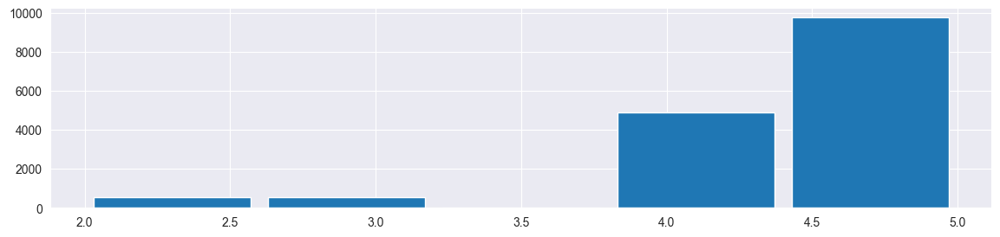

In [34]:
processed_df.doors_count.hist(bins=5, rwidth=0.9)

#### Количество мест

<Axes: >

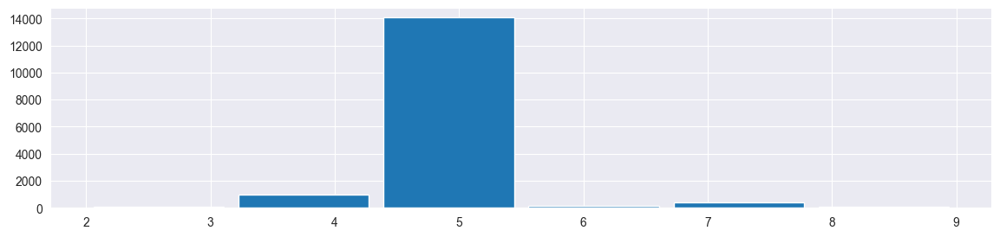

In [35]:
processed_df.seats_count.hist(bins=6, rwidth=0.9)

#### Длина

<Axes: >

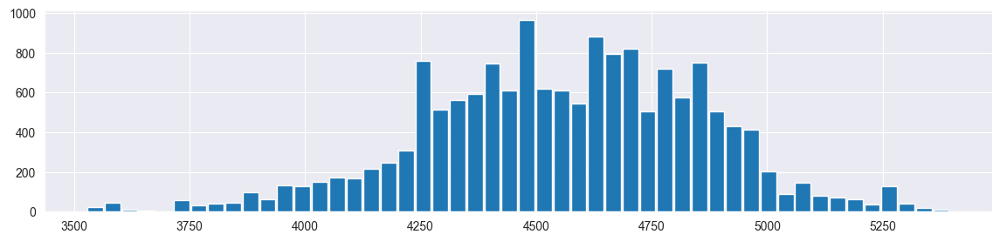

In [36]:
processed_df.length.hist(bins=50, rwidth=0.9)

#### Ширина

<Axes: >

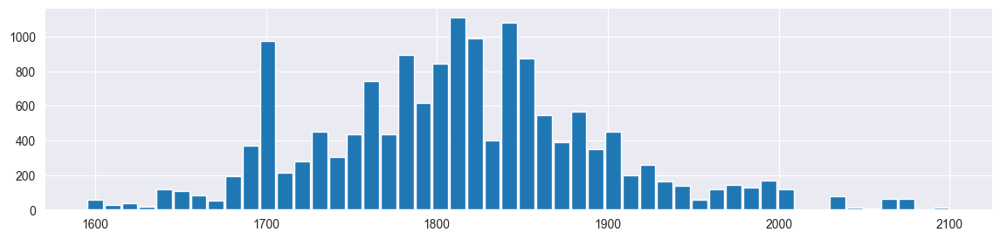

In [37]:
processed_df.width.hist(bins=50, rwidth=0.9)

#### Высота

<Axes: >

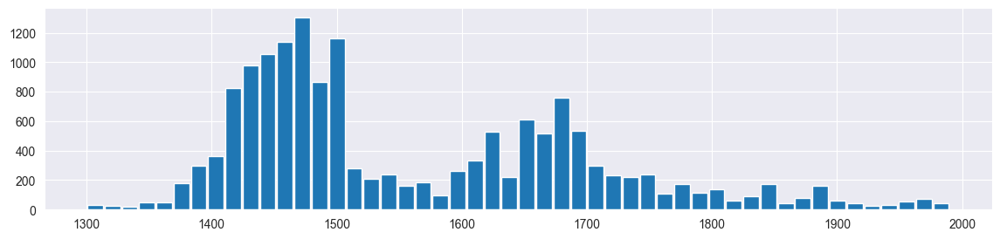

In [38]:
processed_df.height.hist(bins=50, rwidth=0.9)

#### Колёсная база

<Axes: >

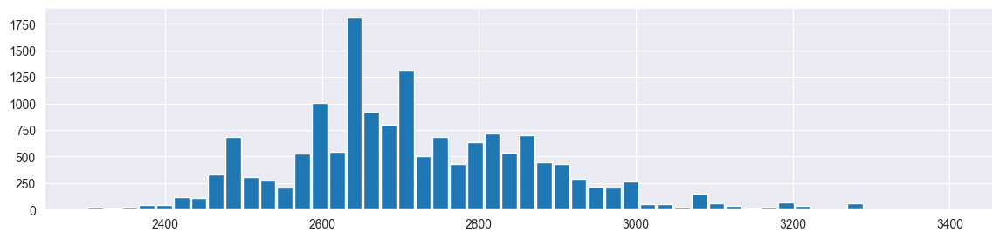

In [39]:
processed_df.wheelbase.hist(bins=50, rwidth=0.9)

#### Клиренс

<Axes: >

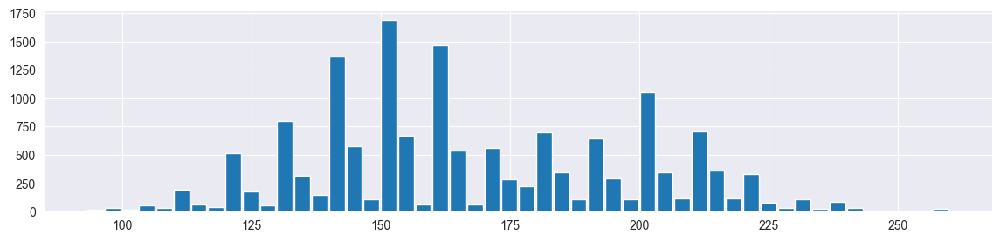

In [40]:
processed_df.clearance.hist(bins=50, rwidth=0.9)

#### Передняя колея

<Axes: >

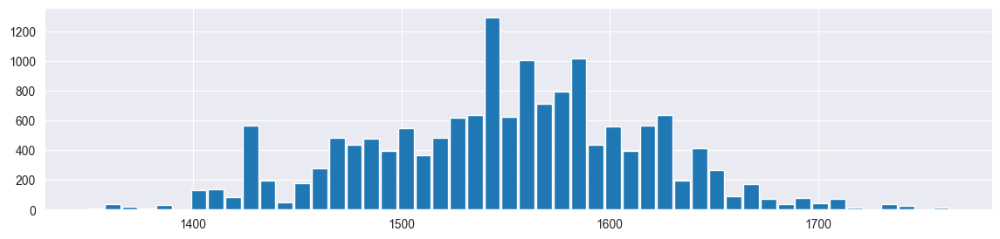

In [41]:
processed_df.front_track.hist(bins=50, rwidth=0.9)

#### Задняя колея

<Axes: >

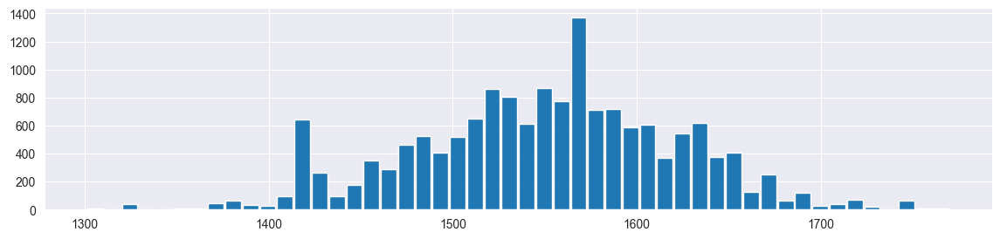

In [42]:
processed_df.rear_track.hist(bins=50, rwidth=0.9)

#### Максимальная скорость

<Axes: >

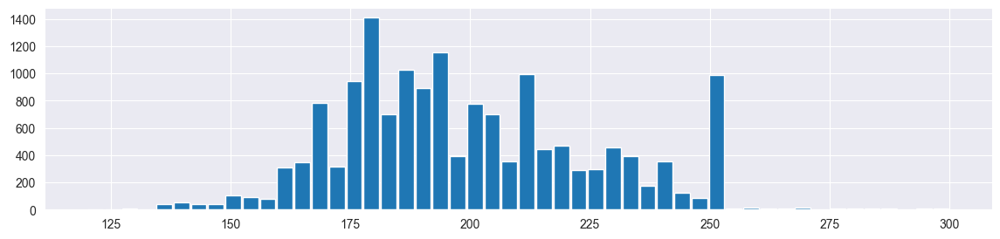

In [43]:
processed_df.max_speed.hist(bins=50, rwidth=0.9)

#### Разгон до 100

<Axes: >

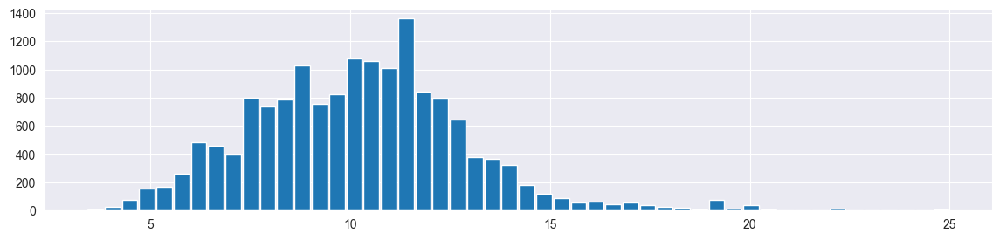

In [44]:
processed_df.zero_to_100.hist(bins=50, rwidth=0.9)

#### Смешанный расход топлива

<Axes: >

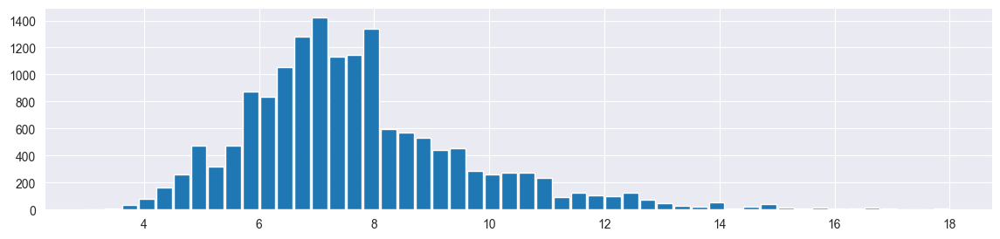

In [45]:
processed_df.fuel_consumption_mixed.hist(bins=50, rwidth=0.9)

#### Объём двигателя

<Axes: >

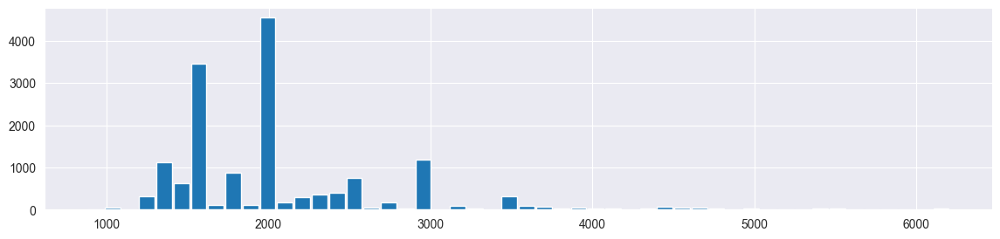

In [46]:
processed_df.engine_displacement.hist(bins=50, rwidth=0.9)

#### Мощность двигателя

<Axes: >

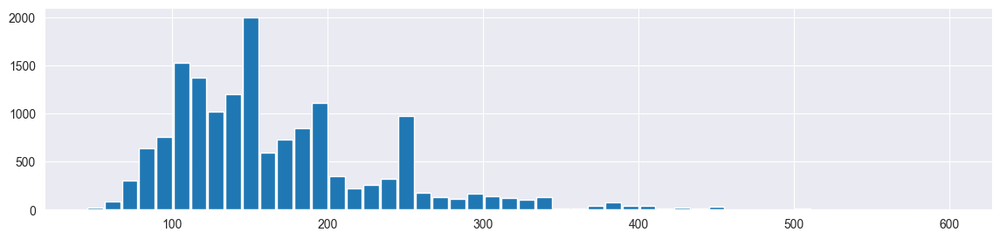

In [47]:
processed_df.engine_max_horsepower.hist(bins=50, rwidth=0.9)

#### Крутящий момент двигателя

<Axes: >

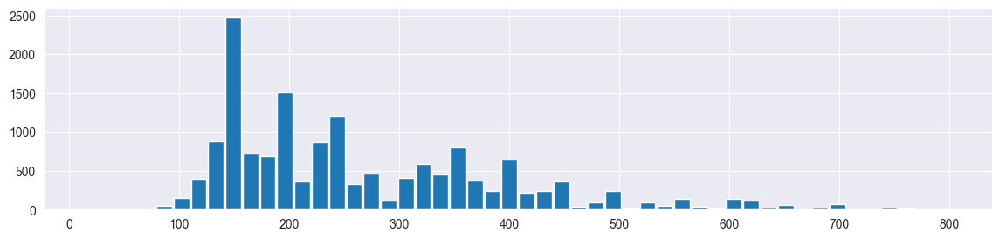

In [48]:
processed_df.engine_max_torque.hist(bins=50, rwidth=0.9)

#### Количество цилиндров в двигателе

<Axes: >

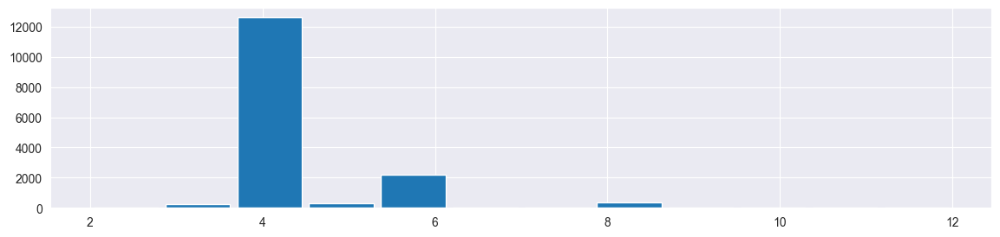

In [49]:
processed_df.engine_cylinders_count.hist(bins=12, rwidth=0.9)

#### Средняя цена

<Axes: >

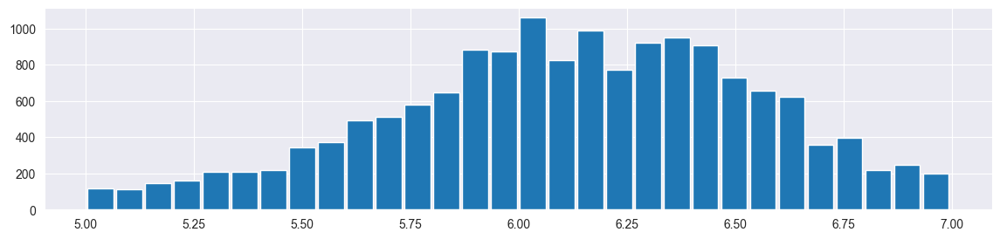

In [50]:
processed_df.price_avg.hist(bins=30, rwidth=0.9)

### Коррелограмма

In [51]:
mc.MoveToLast(processed_df, 'target')

,doors_count,seats_count,length,width,height,wheelbase,clearance,front_track,rear_track,max_speed,...,body_type_Родстер,body_type_Седан,body_type_Универсал,body_type_Фургон,body_type_Хэтчбек,engine_type_ГБО,engine_type_бензиновый,engine_type_гибридный,engine_type_дизельный,target
70,5,5,4394,1781,1722,2619,200,1554,1550,190,...,False,False,False,False,False,False,True,False,False,2
71,5,5,4394,1781,1722,2619,200,1554,1550,171,...,False,False,False,False,False,False,True,False,False,2
74,5,5,4394,1781,1722,2619,200,1554,1550,188,...,False,False,False,False,False,False,True,False,False,2
117,4,6,4782,1904,1940,3098,164,1615,1630,155,...,False,False,False,False,False,False,False,False,True,1
118,4,6,4782,1904,1940,3098,164,1615,1630,155,...,False,False,False,False,False,False,False,False,True,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58263,4,5,4630,1760,1480,2700,150,1505,1510,220,...,False,True,False,False,False,False,True,False,False,1
58264,4,5,4630,1760,1480,2700,150,1505,1510,185,...,False,True,False,False,False,False,True,False,False,1
58266,4,5,4630,1760,1480,2700,150,1505,1510,205,...,False,True,False,False,False,False,True,False,False,1
58267,4,5,4630,1760,1480,2700,150,1505,1510,195,...,False,True,False,False,False,False,True,False,False,1


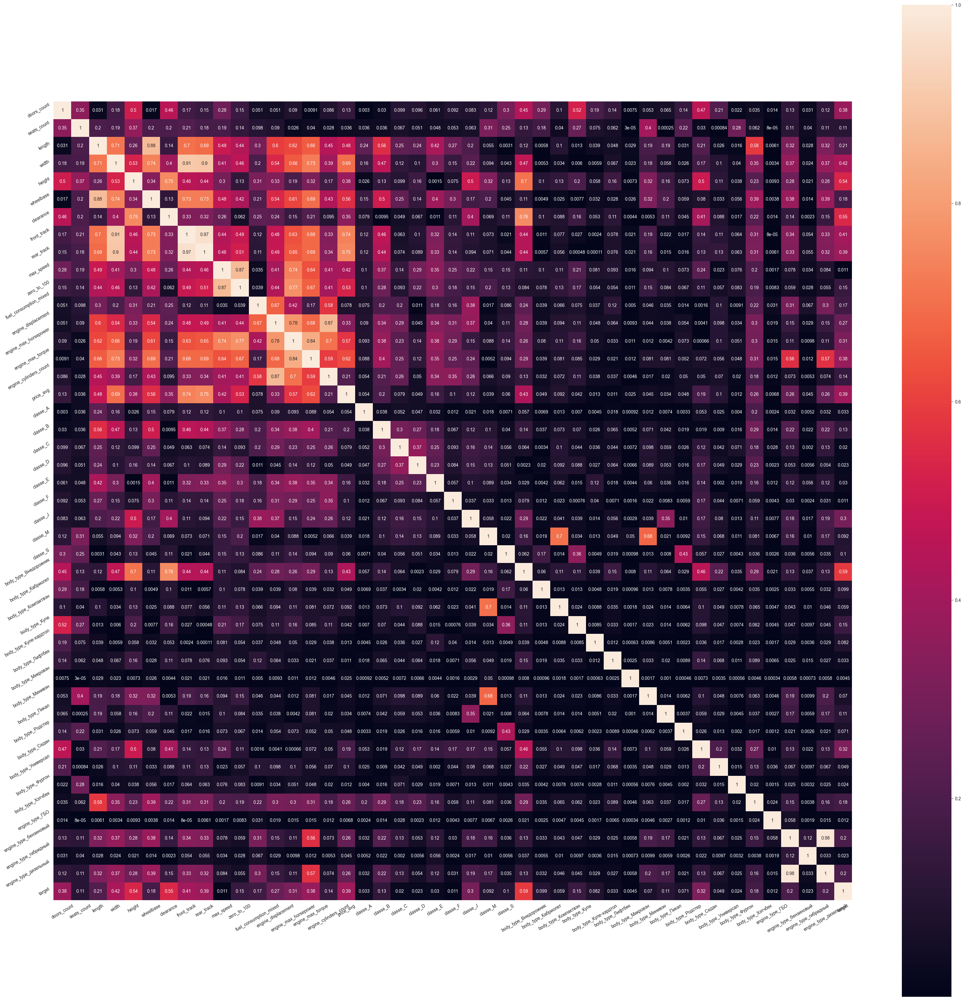

In [52]:
plt.figure(figsize=(40, 40))
sns.heatmap(processed_df.corr().abs(), square=True, linecolor='white', annot=True)
plt.yticks(rotation=30)
plt.xticks(rotation=30)
plt.show()

Штош, смотрим на последнюю строку и видим, что половину фич можно выкинуть к чертям.

Итак, имеет смысл оставить только:
doors_count, width, height, clearance, front_track, rear_track, engine_max_horsepower, engine_max_torque, price_avg, classe_J, body_type_Внедорожник, body_type_Седан

In [53]:
processed_df.columns

Index(['doors_count', 'seats_count', 'length', 'width', 'height', 'wheelbase',
       'clearance', 'front_track', 'rear_track', 'max_speed', 'zero_to_100',
       'fuel_consumption_mixed', 'engine_displacement',
       'engine_max_horsepower', 'engine_max_torque', 'engine_cylinders_count',
       'price_avg', 'classe_A', 'classe_B', 'classe_C', 'classe_D', 'classe_E',
       'classe_F', 'classe_J', 'classe_M', 'classe_S', 'body_type_Внедорожник',
       'body_type_Кабриолет', 'body_type_Компактвэн', 'body_type_Купе',
       'body_type_Купе-хардтоп', 'body_type_Лифтбек', 'body_type_Микровэн',
       'body_type_Минивэн', 'body_type_Пикап', 'body_type_Родстер',
       'body_type_Седан', 'body_type_Универсал', 'body_type_Фургон',
       'body_type_Хэтчбек', 'engine_type_ГБО', 'engine_type_бензиновый',
       'engine_type_гибридный', 'engine_type_дизельный', 'target'],
      dtype='object')

In [54]:
# processed_df = processed_df[["length", "width", "height", "wheelbase", "clearance", "front_track", "rear_track", "max_speed", "zero_to_100", "engine_displacement", "engine_max_horsepower", "engine_max_torque", "engine_cylinders_count", "drive_type_передний", "drive_type_полный", "engine_type_бензиновый", "engine_type_дизельный", "classe_B", "classe_C", "classe_E", "classe_F", "classe_J", "target"]]
# processed_df = processed_df[["length", "width", "height", "wheelbase", "front_track", "rear_track", "max_speed", "zero_to_100", "engine_displacement", "engine_max_horsepower", "engine_max_torque", "engine_cylinders_count", "drive_type_передний", "drive_type_полный", "target"]]
# processed_df = processed_df[
#     ["doors_count", "width", "height", "clearance", "front_track", "rear_track", "engine_max_horsepower",
#      "engine_max_torque", "price_avg", "classe_J", "body_type_Внедорожник", "body_type_Седан", "target"]]

In [55]:
# plt.figure(figsize=(20, 19))
# sns.heatmap(processed_df.corr().abs(), square=True, linecolor='white', annot=True)
# plt.yticks(rotation=30)
# plt.xticks(rotation=30)
# plt.show()

## Разбиение на train, valid, test

In [56]:
x = processed_df.drop('target', axis=1)
y = processed_df['target']
train_features, test_features, train_target, test_target = train_test_split(x, y, test_size=0.5, random_state=0)

print(train_features.shape)
print(train_target.shape)

print(test_features.shape)
print(test_target.shape)

(7863, 44)
(7863,)
(7864, 44)
(7864,)


## Выбор функции качества

По опыту прошлого семестра чувствую, что здесь с кайфом зайдёт f1 мера

In [57]:
from sklearn.metrics import f1_score, classification_report

In [58]:
def stat_visualize(predictions, test):
    predictions = pd.Series(predictions)
    fig, ax = plt.subplots()
    ax.hist(test, bins=3, fc=(0, 1, 0, 1.0))
    ax.hist(predictions, bins=3, fc=(0, 0, 1, 0.5))

In [59]:
def plot_f1_scores(models, labels, is_log=False, **kwargs):
    f1_scores_train = []
    fig, (ax1, ax2) = plt.subplots(1, 2)

    # Вычисление F1-меры для каждой модели
    for model in models:
        y_pred = model.predict(train_features.to_numpy(), **kwargs)
        f1 = f1_score(train_target, y_pred, average='weighted')
        f1_scores_train.append(f1)

    # Построение графика

    ax1.plot(labels, f1_scores_train, marker='o', linestyle='-', color='b')
    ax1.set_xlabel("Высота")
    ax1.set_ylabel('F1-мера')
    ax1.set_title('Train')
    ax1.set_xticks(labels)
    if is_log:
        ax1.set_xscale("log")
    ax1.grid(True)

    f1_scores_test = []
    # Вычисление F1-меры для каждой модели
    for model in models:
        y_pred = model.predict(test_features.to_numpy())
        f1 = f1_score(test_target, y_pred, average='weighted')
        f1_scores_test.append(f1)

    # Построение графика

    ax2.plot(labels, f1_scores_test, marker='o', linestyle='-', color='b')
    ax2.set_xlabel("Высота")
    ax2.set_ylabel('F1-мера')
    ax2.set_title('Test')
    ax2.set_xticks(labels)
    if is_log:
        ax2.set_xscale("log")
    ax2.grid(True)
    plt.show()


In [60]:
def visualize_descent(train_loss, test_loss, test_f1, title=""):
    fig, (ax1) = plt.subplots()
    ax1.set_title(title)
    ax1.set_ylim([0., 1.])
    x_ticks = np.arange(1, len(train_loss) + 1)
    ax1.plot(x_ticks, train_loss, label="Train Loss")
    ax1.plot(x_ticks, test_loss, label="Test Loss")
    ax1.plot(x_ticks, test_f1, label="Test F1")
    ax1.yaxis.tick_right()
    ax1.legend()
    ax1.grid()
    ax1.set_xlabel("# of iter", fontsize=20)

# MLP

## Просто MLP

In [61]:
class MLP(nn.Module):
    def __init__(self, input_size, hidden_layers, output_size, train_mode):
        super(MLP, self).__init__()
        layers = []
        self.train_mode = train_mode
        in_features = input_size
        
        for hidden_units in hidden_layers:
            layers.append(nn.Linear(in_features, hidden_units))
            if self.train_mode:
                layers.append(nn.Dropout(p=0.2))
            layers.append(nn.Sigmoid())
            in_features = hidden_units
        
        layers.append(nn.Linear(in_features, output_size))
        self.network = nn.Sequential(*layers)
    
    def forward(self, x):
        return self.network(x)

In [62]:
print("CUDA is available:", torch.cuda.is_available())
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

input_size = train_features.shape[1]
hidden_layers_options = \
    [[128], 
     [128, 64], 
     [128, 64, 64], 
     [128, 128, 64, 64], 
     [128, 64, 64, 64],
     [128, 128, 128, 128],
     [64, 64, 64, 64],
     [128, 64, 32, 16],
     [128, 64, 32, 16],
     [128, 128, 64, 64, 64],
     ]
output_size = len(np.unique(train_target))
learning_rate = 0.001
num_epochs = 500
batch_size = 2000  # 7863


train_features_torch = torch.from_numpy(train_features.values.astype(np.float64)).float().to(device)
train_target_torch = torch.from_numpy(train_target.values.astype(np.int64)).long().to(device)
test_features_torch = torch.from_numpy(test_features.values.astype(np.float64)).float().to(device)
test_target_torch = torch.from_numpy(test_target.values.astype(np.int64)).long().to(device)

CUDA is available: True


Hidden layers: [128]
Epoch 1/500, Train Loss: 1.0722, Test Loss: 0.9737, Test F1 Score: 0.5604
Epoch 2/500, Train Loss: 0.9555, Test Loss: 0.9017, Test F1 Score: 0.4234
Epoch 3/500, Train Loss: 0.9077, Test Loss: 0.8720, Test F1 Score: 0.4735
Epoch 4/500, Train Loss: 0.8838, Test Loss: 0.8492, Test F1 Score: 0.5559
Epoch 5/500, Train Loss: 0.8653, Test Loss: 0.8396, Test F1 Score: 0.6089
Epoch 6/500, Train Loss: 0.8574, Test Loss: 0.8222, Test F1 Score: 0.6135
Epoch 7/500, Train Loss: 0.8418, Test Loss: 0.8121, Test F1 Score: 0.6503
Epoch 8/500, Train Loss: 0.8295, Test Loss: 0.7962, Test F1 Score: 0.6508
Epoch 9/500, Train Loss: 0.8188, Test Loss: 0.7884, Test F1 Score: 0.6459
Epoch 10/500, Train Loss: 0.8099, Test Loss: 0.7777, Test F1 Score: 0.6823
Epoch 11/500, Train Loss: 0.8014, Test Loss: 0.7686, Test F1 Score: 0.6747
Epoch 12/500, Train Loss: 0.7932, Test Loss: 0.7598, Test F1 Score: 0.6775
Epoch 13/500, Train Loss: 0.7853, Test Loss: 0.7508, Test F1 Score: 0.6834
Epoch 14/500,

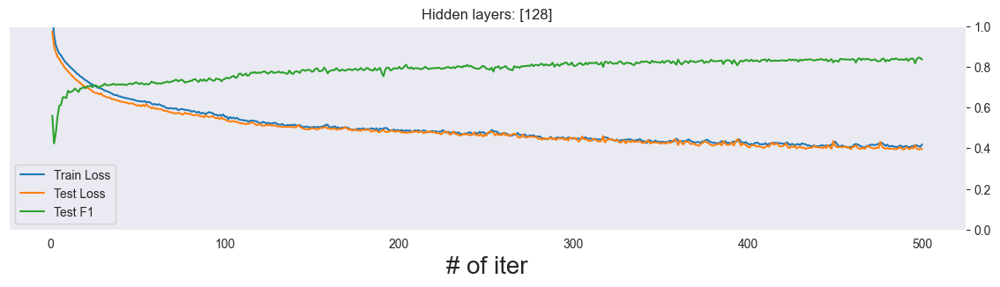

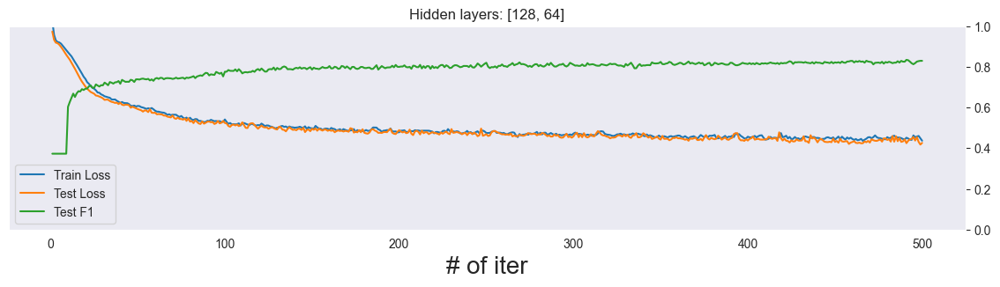

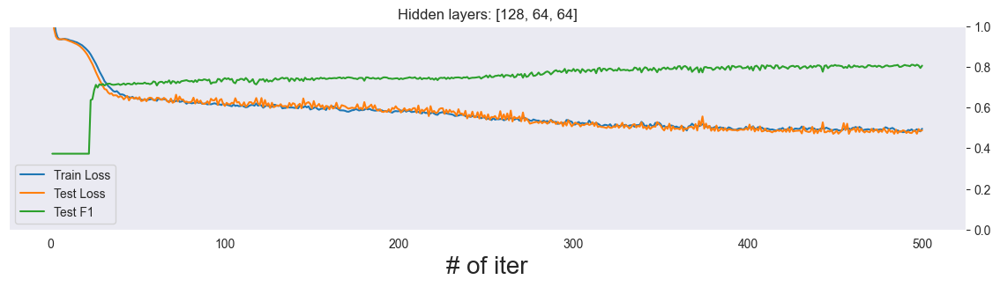

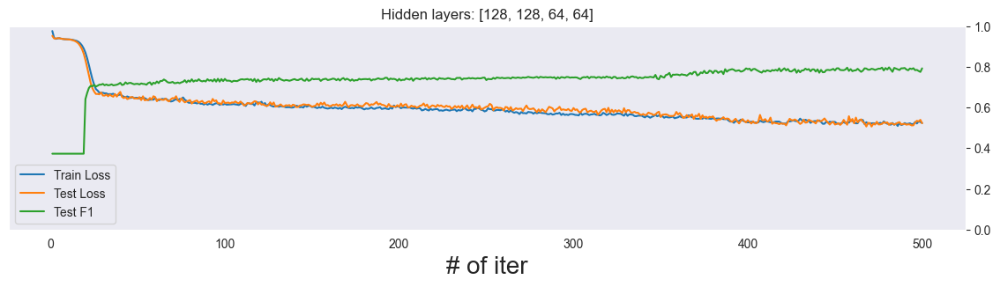

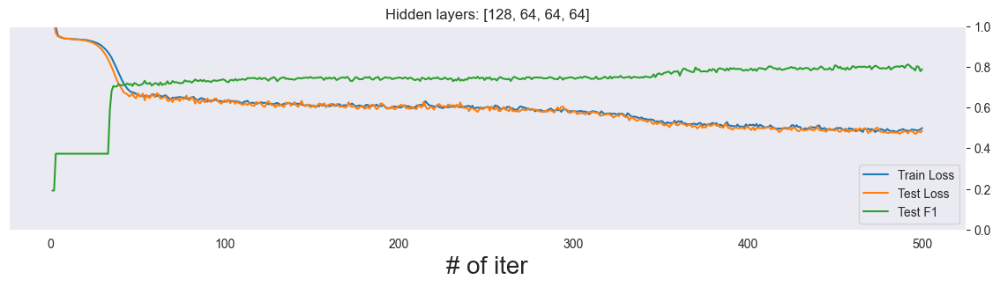

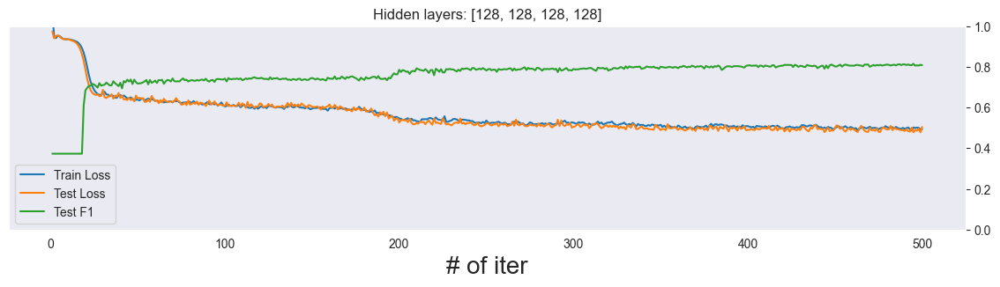

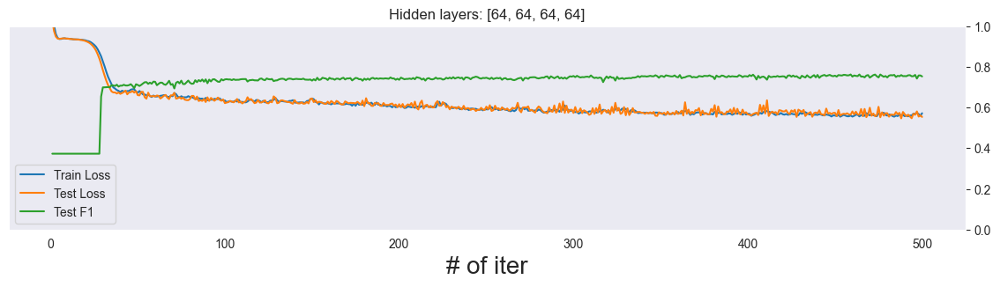

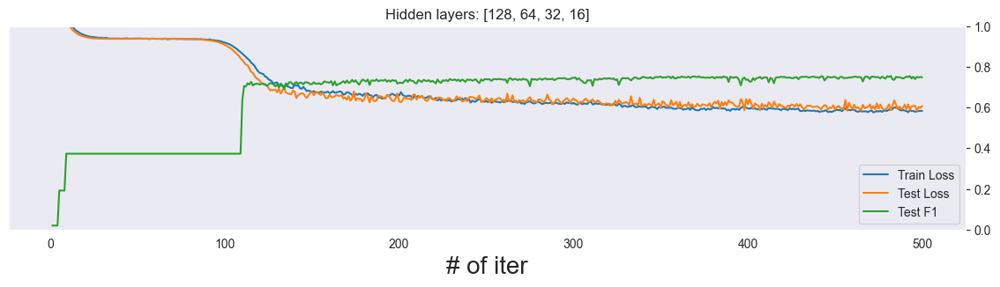

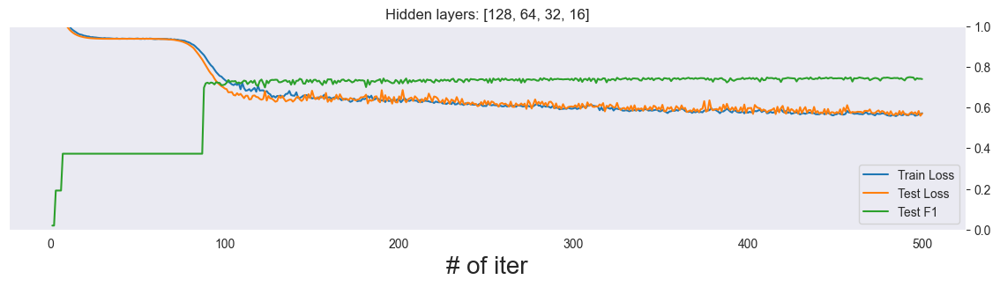

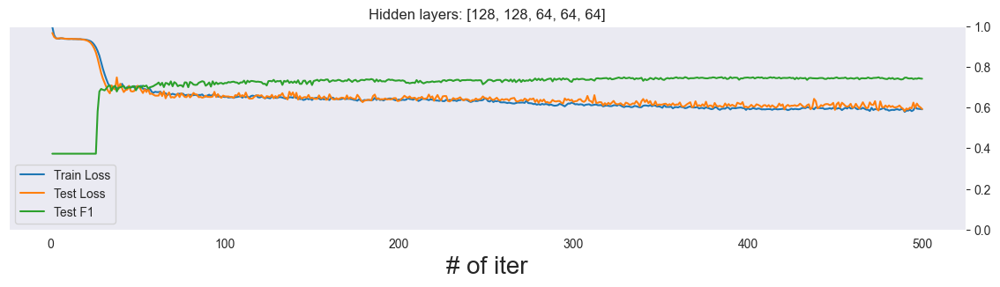

In [63]:
for hidden_layers in hidden_layers_options:
    train_dataset = TensorDataset(train_features_torch, train_target_torch)
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
    
    test_dataset = TensorDataset(test_features_torch, test_target_torch)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)
    
    model = MLP(input_size=input_size, hidden_layers=hidden_layers, output_size=output_size, train_mode=True).to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    
    print(f"Hidden layers: {hidden_layers}")
    train_loss_history = []
    test_loss_history = []
    test_f1_history = []
    for epoch in range(num_epochs):
        model.train()
        train_loss = 0
        for features, target in train_loader:
            optimizer.zero_grad()
            outputs = model(features)
            loss = criterion(outputs, target)
            loss.backward()
            optimizer.step()
            train_loss += loss.item()
        
        train_loss /= len(train_loader)
        
        model.eval()
        test_loss = 0
        all_preds = []
        all_targets = []
        
        with torch.no_grad():
            for features, target in test_loader:
                outputs = model(features)
                loss = criterion(outputs, target)
                test_loss += loss.item()
                
                preds = torch.argmax(outputs, dim=1)
                all_preds.extend(preds.cpu().numpy())
                all_targets.extend(target.cpu().numpy())
        
        test_loss /= len(test_loader)
        test_f1 = f1_score(all_targets, all_preds, average='weighted')
        
        train_loss_history.append(train_loss)
        test_loss_history.append(test_loss)
        test_f1_history.append(test_f1)
        print(f"Epoch {epoch+1}/{num_epochs}, Train Loss: {train_loss:.4f}, Test Loss: {test_loss:.4f}, Test F1 Score: {test_f1:.4f}")
    visualize_descent(train_loss_history, test_loss_history, test_f1_history, title=f"Hidden layers: {hidden_layers}")

### Зависимость от числа слоёв

In [64]:
def hidden_layers_gen(count):
    if count == 1:
        return [128]
    return [128 for _ in range(count // 2)] + [64 for _ in range(count - (count // 2))]

Hidden layers: [128]
Epoch 1/500, Train Loss: 1.0705, Test Loss: 0.9720, Test F1 Score: 0.3729
Epoch 2/500, Train Loss: 0.9374, Test Loss: 0.8700, Test F1 Score: 0.4771
Epoch 3/500, Train Loss: 0.8760, Test Loss: 0.8479, Test F1 Score: 0.5992
Epoch 4/500, Train Loss: 0.8626, Test Loss: 0.8394, Test F1 Score: 0.6014
Epoch 5/500, Train Loss: 0.8557, Test Loss: 0.8334, Test F1 Score: 0.6063
Epoch 6/500, Train Loss: 0.8475, Test Loss: 0.8248, Test F1 Score: 0.6153
Epoch 7/500, Train Loss: 0.8412, Test Loss: 0.8105, Test F1 Score: 0.6241
Epoch 8/500, Train Loss: 0.8325, Test Loss: 0.8011, Test F1 Score: 0.6316
Epoch 9/500, Train Loss: 0.8216, Test Loss: 0.7914, Test F1 Score: 0.6297
Epoch 10/500, Train Loss: 0.8138, Test Loss: 0.7816, Test F1 Score: 0.6229
Epoch 11/500, Train Loss: 0.8037, Test Loss: 0.7727, Test F1 Score: 0.6263
Epoch 12/500, Train Loss: 0.7949, Test Loss: 0.7621, Test F1 Score: 0.6396
Epoch 13/500, Train Loss: 0.7866, Test Loss: 0.7562, Test F1 Score: 0.6337
Epoch 14/500,

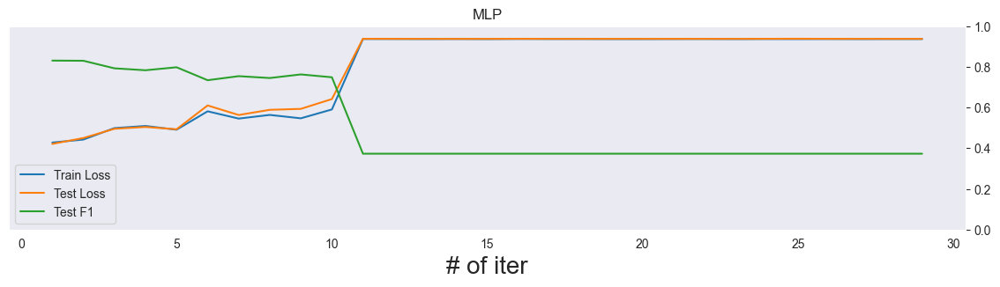

In [65]:
train_loss_history = []
test_loss_history = []
test_f1_history = []
for i in range(1, 30):
    hidden_layers = hidden_layers_gen(i)
    
    train_dataset = TensorDataset(train_features_torch, train_target_torch)
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

    test_dataset = TensorDataset(test_features_torch, test_target_torch)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

    model = MLP(input_size=input_size, hidden_layers=hidden_layers, output_size=output_size, train_mode=True).to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)

    print(f"Hidden layers: {hidden_layers}")


    last_train_loss = None
    last_test_loss = None
    last_test_f1 = None
    for epoch in range(num_epochs):
        model.train()
        train_loss = 0
        for features, target in train_loader:
            optimizer.zero_grad()
            outputs = model(features)
            loss = criterion(outputs, target)
            loss.backward()
            optimizer.step()
            train_loss += loss.item()

        train_loss /= len(train_loader)

        model.eval()
        test_loss = 0
        all_preds = []
        all_targets = []

        with torch.no_grad():
            for features, target in test_loader:
                outputs = model(features)
                loss = criterion(outputs, target)
                test_loss += loss.item()

                preds = torch.argmax(outputs, dim=1)
                all_preds.extend(preds.cpu().numpy())
                all_targets.extend(target.cpu().numpy())

        test_loss /= len(test_loader)
        test_f1 = f1_score(all_targets, all_preds, average='weighted')

        last_train_loss = train_loss
        last_test_loss = test_loss
        last_test_f1 = test_f1
        print(
            f"Epoch {epoch + 1}/{num_epochs}, Train Loss: {train_loss:.4f}, Test Loss: {test_loss:.4f}, Test F1 Score: {test_f1:.4f}")
    train_loss_history.append(last_train_loss)
    test_loss_history.append(last_test_loss)
    test_f1_history.append(last_test_f1)
visualize_descent(train_loss_history, test_loss_history, test_f1_history, title=f"MLP")

## То же самое, но с Xavier

In [66]:
class MLPXavier(nn.Module):
    def __init__(self, input_size, hidden_layers, output_size, train_mode):
        super(MLPXavier, self).__init__()
        layers = []
        self.train_mode = train_mode
        in_features = input_size
        
        for hidden_units in hidden_layers:
            layers.append(nn.Linear(in_features, hidden_units))
            if self.train_mode:
                layers.append(nn.Dropout(p=0.2))
            layers.append(nn.Sigmoid())
            in_features = hidden_units
        
        layers.append(nn.Linear(in_features, output_size))
        self.network = nn.Sequential(*layers)
        self.init_weights()
    
    def init_weights(self):
        for layer in self.network:
            if isinstance(layer, nn.Linear):
                nn.init.xavier_uniform_(layer.weight)
    
    def forward(self, x):
        return self.network(x)

In [67]:
print("CUDA is available:", torch.cuda.is_available())
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

input_size = train_features.shape[1]
hidden_layers_options = \
    [[128], 
     [128, 64], 
     [128, 64, 64], 
     [128, 128, 64, 64], 
     [128, 64, 64, 64],
     [128, 128, 128, 128],
     [64, 64, 64, 64],
     [128, 64, 32, 16],
     [128, 64, 32, 16],
     [128, 128, 64, 64, 64],
     ]
output_size = len(np.unique(train_target))
learning_rate = 0.001
num_epochs = 500
batch_size = 2000  # 7863


train_features_torch = torch.from_numpy(train_features.values.astype(np.float64)).float().to(device)
train_target_torch = torch.from_numpy(train_target.values.astype(np.int64)).long().to(device)
test_features_torch = torch.from_numpy(test_features.values.astype(np.float64)).float().to(device)
test_target_torch = torch.from_numpy(test_target.values.astype(np.int64)).long().to(device)

CUDA is available: True


Hidden layers: [128]
Epoch 1/500, Train Loss: 1.1550, Test Loss: 0.9970, Test F1 Score: 0.5969
Epoch 2/500, Train Loss: 0.9732, Test Loss: 0.8732, Test F1 Score: 0.6082
Epoch 3/500, Train Loss: 0.9013, Test Loss: 0.8498, Test F1 Score: 0.5691
Epoch 4/500, Train Loss: 0.8768, Test Loss: 0.8410, Test F1 Score: 0.5743
Epoch 5/500, Train Loss: 0.8677, Test Loss: 0.8268, Test F1 Score: 0.5950
Epoch 6/500, Train Loss: 0.8535, Test Loss: 0.8118, Test F1 Score: 0.6151
Epoch 7/500, Train Loss: 0.8407, Test Loss: 0.8004, Test F1 Score: 0.6123
Epoch 8/500, Train Loss: 0.8320, Test Loss: 0.7872, Test F1 Score: 0.6104
Epoch 9/500, Train Loss: 0.8219, Test Loss: 0.7779, Test F1 Score: 0.6213
Epoch 10/500, Train Loss: 0.8152, Test Loss: 0.7722, Test F1 Score: 0.6088
Epoch 11/500, Train Loss: 0.8065, Test Loss: 0.7647, Test F1 Score: 0.6255
Epoch 12/500, Train Loss: 0.8047, Test Loss: 0.7594, Test F1 Score: 0.6208
Epoch 13/500, Train Loss: 0.7933, Test Loss: 0.7525, Test F1 Score: 0.6372
Epoch 14/500,

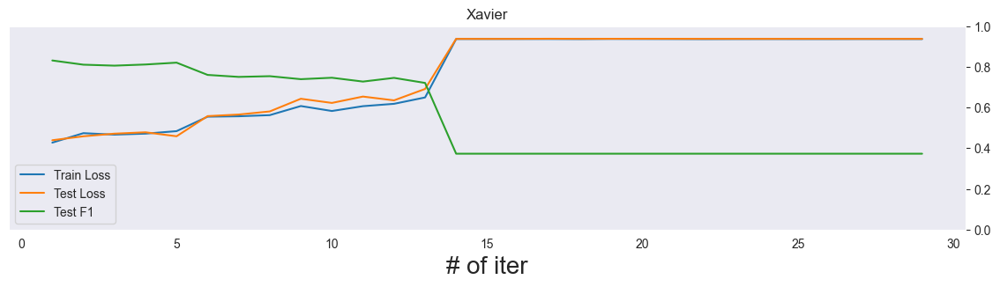

In [68]:
train_loss_history = []
test_loss_history = []
test_f1_history = []
for i in range(1, 30):
    hidden_layers = hidden_layers_gen(i)
    
    train_dataset = TensorDataset(train_features_torch, train_target_torch)
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

    test_dataset = TensorDataset(test_features_torch, test_target_torch)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

    model = MLPXavier(input_size=input_size, hidden_layers=hidden_layers, output_size=output_size, train_mode=True).to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)

    print(f"Hidden layers: {hidden_layers}")


    last_train_loss = None
    last_test_loss = None
    last_test_f1 = None
    for epoch in range(num_epochs):
        model.train()
        train_loss = 0
        for features, target in train_loader:
            optimizer.zero_grad()
            outputs = model(features)
            loss = criterion(outputs, target)
            loss.backward()
            optimizer.step()
            train_loss += loss.item()

        train_loss /= len(train_loader)

        model.eval()
        test_loss = 0
        all_preds = []
        all_targets = []

        with torch.no_grad():
            for features, target in test_loader:
                outputs = model(features)
                loss = criterion(outputs, target)
                test_loss += loss.item()

                preds = torch.argmax(outputs, dim=1)
                all_preds.extend(preds.cpu().numpy())
                all_targets.extend(target.cpu().numpy())

        test_loss /= len(test_loader)
        test_f1 = f1_score(all_targets, all_preds, average='weighted')

        last_train_loss = train_loss
        last_test_loss = test_loss
        last_test_f1 = test_f1
        print(
            f"Epoch {epoch + 1}/{num_epochs}, Train Loss: {train_loss:.4f}, Test Loss: {test_loss:.4f}, Test F1 Score: {test_f1:.4f}")
    train_loss_history.append(last_train_loss)
    test_loss_history.append(last_test_loss)
    test_f1_history.append(last_test_f1)
visualize_descent(train_loss_history, test_loss_history, test_f1_history, title=f"Xavier")

## То же самое, но с пакетной нормализацией

In [69]:
class MLPXavierBatchNorm(nn.Module):
    def __init__(self, input_size, hidden_layers, output_size, train_mode):
        super(MLPXavierBatchNorm, self).__init__()
        layers = []
        self.train_mode = train_mode
        in_features = input_size
        
        for hidden_units in hidden_layers:
            layers.append(nn.Linear(in_features, hidden_units))
            if self.train_mode:
                layers.append(nn.Dropout(p=0.2))
            layers.append(nn.BatchNorm1d(hidden_units, momentum=0.9))
            layers.append(nn.Sigmoid())
            in_features = hidden_units
        
        layers.append(nn.Linear(in_features, output_size))
        self.network = nn.Sequential(*layers)
        self.init_weights()
    
    def init_weights(self):
        for layer in self.network:
            if isinstance(layer, nn.Linear):
                nn.init.xavier_uniform_(layer.weight)
    
    def forward(self, x):
        return self.network(x)

In [70]:
print("CUDA is available:", torch.cuda.is_available())
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

input_size = train_features.shape[1]
hidden_layers_options = \
    [[128], 
     [128, 64], 
     [128, 64, 64], 
     [128, 128, 64, 64], 
     [128, 64, 64, 64],
     [128, 128, 128, 128],
     [64, 64, 64, 64],
     [128, 64, 32, 16],
     [128, 64, 32, 16],
     [128, 128, 64, 64, 64],
     ]
output_size = len(np.unique(train_target))
learning_rate = 0.001
num_epochs = 500
batch_size = 2000  # 7863


train_features_torch = torch.from_numpy(train_features.values.astype(np.float64)).float().to(device)
train_target_torch = torch.from_numpy(train_target.values.astype(np.int64)).long().to(device)
test_features_torch = torch.from_numpy(test_features.values.astype(np.float64)).float().to(device)
test_target_torch = torch.from_numpy(test_target.values.astype(np.int64)).long().to(device)

CUDA is available: True


Hidden layers: [128]
Epoch 1/500, Train Loss: 1.3379, Test Loss: 1.2006, Test F1 Score: 0.1918
Epoch 2/500, Train Loss: 1.1187, Test Loss: 0.9979, Test F1 Score: 0.2597
Epoch 3/500, Train Loss: 0.9668, Test Loss: 0.8826, Test F1 Score: 0.6600
Epoch 4/500, Train Loss: 0.8792, Test Loss: 0.8299, Test F1 Score: 0.5970
Epoch 5/500, Train Loss: 0.8418, Test Loss: 0.8040, Test F1 Score: 0.5811
Epoch 6/500, Train Loss: 0.8211, Test Loss: 0.7901, Test F1 Score: 0.5782
Epoch 7/500, Train Loss: 0.8048, Test Loss: 0.7741, Test F1 Score: 0.5876
Epoch 8/500, Train Loss: 0.7886, Test Loss: 0.7600, Test F1 Score: 0.6054
Epoch 9/500, Train Loss: 0.7735, Test Loss: 0.7443, Test F1 Score: 0.6192
Epoch 10/500, Train Loss: 0.7564, Test Loss: 0.7273, Test F1 Score: 0.6391
Epoch 11/500, Train Loss: 0.7424, Test Loss: 0.7154, Test F1 Score: 0.6445
Epoch 12/500, Train Loss: 0.7289, Test Loss: 0.7046, Test F1 Score: 0.6451
Epoch 13/500, Train Loss: 0.7196, Test Loss: 0.6941, Test F1 Score: 0.6467
Epoch 14/500,

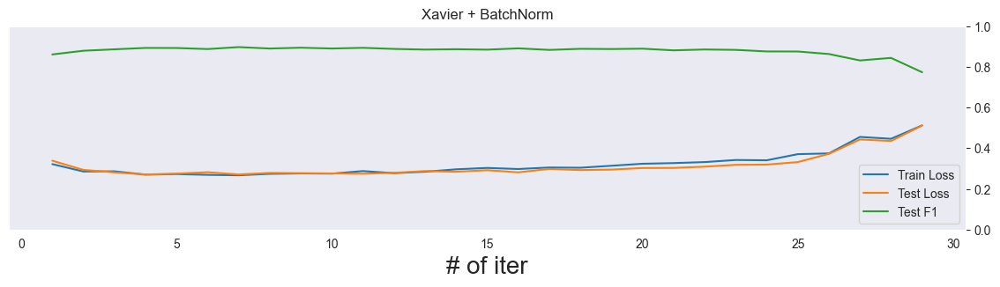

In [71]:
train_loss_history = []
test_loss_history = []
test_f1_history = []
for i in range(1, 30):
    hidden_layers = hidden_layers_gen(i)
    
    train_dataset = TensorDataset(train_features_torch, train_target_torch)
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

    test_dataset = TensorDataset(test_features_torch, test_target_torch)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

    model = MLPXavierBatchNorm(input_size=input_size, hidden_layers=hidden_layers, output_size=output_size, train_mode=True).to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)

    print(f"Hidden layers: {hidden_layers}")


    last_train_loss = None
    last_test_loss = None
    last_test_f1 = None
    for epoch in range(num_epochs):
        model.train()
        train_loss = 0
        for features, target in train_loader:
            optimizer.zero_grad()
            outputs = model(features)
            loss = criterion(outputs, target)
            loss.backward()
            optimizer.step()
            train_loss += loss.item()

        train_loss /= len(train_loader)

        model.eval()
        test_loss = 0
        all_preds = []
        all_targets = []

        with torch.no_grad():
            for features, target in test_loader:
                outputs = model(features)
                loss = criterion(outputs, target)
                test_loss += loss.item()

                preds = torch.argmax(outputs, dim=1)
                all_preds.extend(preds.cpu().numpy())
                all_targets.extend(target.cpu().numpy())

        test_loss /= len(test_loader)
        test_f1 = f1_score(all_targets, all_preds, average='weighted')

        last_train_loss = train_loss
        last_test_loss = test_loss
        last_test_f1 = test_f1
        print(
            f"Epoch {epoch + 1}/{num_epochs}, Train Loss: {train_loss:.4f}, Test Loss: {test_loss:.4f}, Test F1 Score: {test_f1:.4f}")
    train_loss_history.append(last_train_loss)
    test_loss_history.append(last_test_loss)
    test_f1_history.append(last_test_f1)
visualize_descent(train_loss_history, test_loss_history, test_f1_history, title=f"Xavier + BatchNorm")

# ResNet

## Просто ResNet

![](data/screenshot1.png)

In [72]:
class ResidualBlock(nn.Module):
    def __init__(self, input_dim):
        super(ResidualBlock, self).__init__()
        self.fc1 = nn.Linear(input_dim, input_dim)
        self.relu = nn.ReLU(inplace=True)
        self.fc2 = nn.Linear(input_dim, input_dim)

    def forward(self, x):
        residual = x
        out = self.fc1(x)
        out = self.relu(out)
        out = self.fc2(out)
        out += residual
        out = self.relu(out)
        return out

class ResNet(nn.Module):
    def __init__(self, input_size, hidden_layers_size, output_size, num_layers):
        super(ResNet, self).__init__()
        self.input_layer = nn.Linear(input_size, hidden_layers_size)
        self.relu = nn.ReLU(inplace=True)
        layers = []
        for _ in range(num_layers):
            layers.append(ResidualBlock(hidden_layers_size))
        self.layers = nn.Sequential(*layers)
        self.output_layer = nn.Linear(hidden_layers_size, output_size)

    def forward(self, x):
        x = self.input_layer(x)
        x = self.relu(x)
        x = self.layers(x)
        x = self.output_layer(x)
        return x


In [73]:
print("CUDA is available:", torch.cuda.is_available())
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

input_size = train_features.shape[1]
hidden_layers_size = 64
output_size = len(np.unique(train_target))
learning_rate = 0.001
num_epochs = 500
batch_size = 2000  # 7863


train_features_torch = torch.from_numpy(train_features.values.astype(np.float64)).float().to(device)
train_target_torch = torch.from_numpy(train_target.values.astype(np.int64)).long().to(device)
test_features_torch = torch.from_numpy(test_features.values.astype(np.float64)).float().to(device)
test_target_torch = torch.from_numpy(test_target.values.astype(np.int64)).long().to(device)

CUDA is available: True


Hidden layers: 1
Epoch 1/500, Train Loss: 73.7390, Test Loss: 70.1172, Test F1 Score: 0.1922
Epoch 2/500, Train Loss: 47.2061, Test Loss: 29.2640, Test F1 Score: 0.3203
Epoch 3/500, Train Loss: 33.7687, Test Loss: 17.3348, Test F1 Score: 0.3666
Epoch 4/500, Train Loss: 15.4186, Test Loss: 8.9892, Test F1 Score: 0.2932
Epoch 5/500, Train Loss: 9.7902, Test Loss: 8.2993, Test F1 Score: 0.5709
Epoch 6/500, Train Loss: 6.5819, Test Loss: 5.4216, Test F1 Score: 0.5580
Epoch 7/500, Train Loss: 4.8420, Test Loss: 5.1367, Test F1 Score: 0.6506
Epoch 8/500, Train Loss: 4.0428, Test Loss: 4.9675, Test F1 Score: 0.5704
Epoch 9/500, Train Loss: 3.6251, Test Loss: 3.9069, Test F1 Score: 0.6867
Epoch 10/500, Train Loss: 3.1019, Test Loss: 3.1113, Test F1 Score: 0.7024
Epoch 11/500, Train Loss: 2.6390, Test Loss: 2.5282, Test F1 Score: 0.7318
Epoch 12/500, Train Loss: 2.3198, Test Loss: 2.2522, Test F1 Score: 0.7650
Epoch 13/500, Train Loss: 2.0032, Test Loss: 1.9928, Test F1 Score: 0.7337
Epoch 14/5

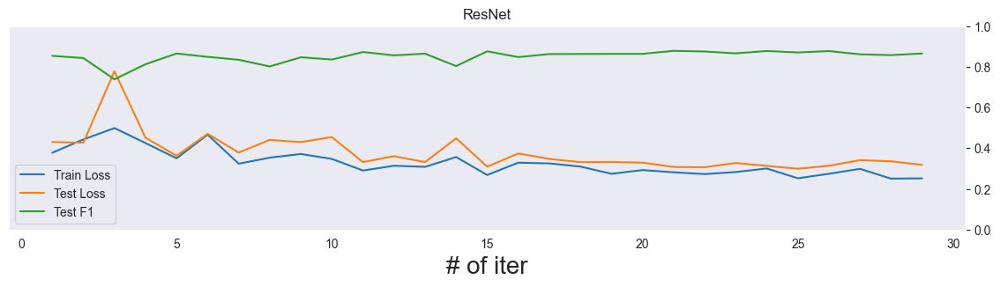

In [74]:
train_loss_history = []
test_loss_history = []
test_f1_history = []
for i in range(1, 30):
    train_dataset = TensorDataset(train_features_torch, train_target_torch)
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

    test_dataset = TensorDataset(test_features_torch, test_target_torch)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

    model = ResNet(input_size=input_size, hidden_layers_size=64, num_layers=i, output_size=output_size).to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)

    print(f"Hidden layers: {i}")


    last_train_loss = None
    last_test_loss = None
    last_test_f1 = None
    for epoch in range(num_epochs):
        model.train()
        train_loss = 0
        for features, target in train_loader:
            optimizer.zero_grad()
            outputs = model(features)
            loss = criterion(outputs, target)
            loss.backward()
            optimizer.step()
            train_loss += loss.item()

        train_loss /= len(train_loader)

        model.eval()
        test_loss = 0
        all_preds = []
        all_targets = []

        with torch.no_grad():
            for features, target in test_loader:
                outputs = model(features)
                loss = criterion(outputs, target)
                test_loss += loss.item()

                preds = torch.argmax(outputs, dim=1)
                all_preds.extend(preds.cpu().numpy())
                all_targets.extend(target.cpu().numpy())

        test_loss /= len(test_loader)
        test_f1 = f1_score(all_targets, all_preds, average='weighted')

        last_train_loss = train_loss
        last_test_loss = test_loss
        last_test_f1 = test_f1
        print(
            f"Epoch {epoch + 1}/{num_epochs}, Train Loss: {train_loss:.4f}, Test Loss: {test_loss:.4f}, Test F1 Score: {test_f1:.4f}")
    train_loss_history.append(last_train_loss)
    test_loss_history.append(last_test_loss)
    test_f1_history.append(last_test_f1)
visualize_descent(train_loss_history, test_loss_history, test_f1_history, title=f"ResNet")

## То же самое, но с Xavier

In [75]:
class ResidualBlockXavier(nn.Module):
    def __init__(self, input_dim):
        super(ResidualBlockXavier, self).__init__()
        self.fc1 = nn.Linear(input_dim, input_dim)
        self.relu = nn.ReLU(inplace=True)
        self.fc2 = nn.Linear(input_dim, input_dim)
        
        nn.init.xavier_uniform_(self.fc1.weight)
        nn.init.xavier_uniform_(self.fc2.weight)

    def forward(self, x):
        residual = x
        out = self.fc1(x)
        out = self.relu(out)
        out = self.fc2(out)
        out += residual
        out = self.relu(out)
        return out

class ResNetXavier(nn.Module):
    def __init__(self, input_size, hidden_layers_size, output_size, num_layers):
        super(ResNetXavier, self).__init__()
        self.input_layer = nn.Linear(input_size, hidden_layers_size)
        self.relu = nn.ReLU(inplace=True)
        layers = []
        for _ in range(num_layers):
            layers.append(ResidualBlockXavier(hidden_layers_size))
        self.layers = nn.Sequential(*layers)
        self.output_layer = nn.Linear(hidden_layers_size, output_size)
    
        nn.init.xavier_uniform_(self.input_layer.weight)
        nn.init.xavier_uniform_(self.output_layer.weight)

    def forward(self, x):
        x = self.input_layer(x)
        x = self.relu(x)
        x = self.layers(x)
        x = self.output_layer(x)
        return x


In [76]:
print("CUDA is available:", torch.cuda.is_available())
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

input_size = train_features.shape[1]
hidden_layers_size = 64
output_size = len(np.unique(train_target))
learning_rate = 0.001
num_epochs = 500
batch_size = 2000  # 7863


train_features_torch = torch.from_numpy(train_features.values.astype(np.float64)).float().to(device)
train_target_torch = torch.from_numpy(train_target.values.astype(np.int64)).long().to(device)
test_features_torch = torch.from_numpy(test_features.values.astype(np.float64)).float().to(device)
test_target_torch = torch.from_numpy(test_target.values.astype(np.int64)).long().to(device)

CUDA is available: True


Hidden layers: 1
Epoch 1/500, Train Loss: 1195.9204, Test Loss: 410.7878, Test F1 Score: 0.0195
Epoch 2/500, Train Loss: 180.1695, Test Loss: 137.6111, Test F1 Score: 0.3743
Epoch 3/500, Train Loss: 142.0873, Test Loss: 137.4361, Test F1 Score: 0.4416
Epoch 4/500, Train Loss: 155.6294, Test Loss: 156.6970, Test F1 Score: 0.5352
Epoch 5/500, Train Loss: 162.5722, Test Loss: 161.2872, Test F1 Score: 0.6033
Epoch 6/500, Train Loss: 159.0669, Test Loss: 150.0617, Test F1 Score: 0.6118
Epoch 7/500, Train Loss: 145.3743, Test Loss: 132.6414, Test F1 Score: 0.6212
Epoch 8/500, Train Loss: 125.2342, Test Loss: 107.4868, Test F1 Score: 0.6307
Epoch 9/500, Train Loss: 98.8906, Test Loss: 78.3517, Test F1 Score: 0.6381
Epoch 10/500, Train Loss: 68.5157, Test Loss: 48.3463, Test F1 Score: 0.6242
Epoch 11/500, Train Loss: 37.3273, Test Loss: 18.2769, Test F1 Score: 0.6043
Epoch 12/500, Train Loss: 23.3276, Test Loss: 20.6203, Test F1 Score: 0.4678
Epoch 13/500, Train Loss: 18.3611, Test Loss: 16.32

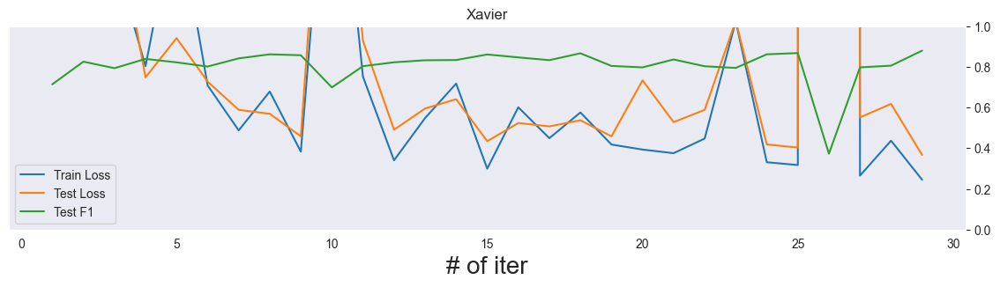

In [77]:
train_loss_history = []
test_loss_history = []
test_f1_history = []
for i in range(1, 30):
    train_dataset = TensorDataset(train_features_torch, train_target_torch)
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

    test_dataset = TensorDataset(test_features_torch, test_target_torch)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

    model = ResNetXavier(input_size=input_size, hidden_layers_size=64, num_layers=i, output_size=output_size).to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)

    print(f"Hidden layers: {i}")


    last_train_loss = None
    last_test_loss = None
    last_test_f1 = None
    for epoch in range(num_epochs):
        model.train()
        train_loss = 0
        for features, target in train_loader:
            optimizer.zero_grad()
            outputs = model(features)
            loss = criterion(outputs, target)
            loss.backward()
            optimizer.step()
            train_loss += loss.item()

        train_loss /= len(train_loader)

        model.eval()
        test_loss = 0
        all_preds = []
        all_targets = []

        with torch.no_grad():
            for features, target in test_loader:
                outputs = model(features)
                loss = criterion(outputs, target)
                test_loss += loss.item()

                preds = torch.argmax(outputs, dim=1)
                all_preds.extend(preds.cpu().numpy())
                all_targets.extend(target.cpu().numpy())

        test_loss /= len(test_loader)
        test_f1 = f1_score(all_targets, all_preds, average='weighted')

        last_train_loss = train_loss
        last_test_loss = test_loss
        last_test_f1 = test_f1
        print(
            f"Epoch {epoch + 1}/{num_epochs}, Train Loss: {train_loss:.4f}, Test Loss: {test_loss:.4f}, Test F1 Score: {test_f1:.4f}")
    train_loss_history.append(last_train_loss)
    test_loss_history.append(last_test_loss)
    test_f1_history.append(last_test_f1)
visualize_descent(train_loss_history, test_loss_history, test_f1_history, title="Xavier")

## То же самое, но с пакетной нормализацией

In [78]:
class ResidualBlockXavierBatchNorm(nn.Module):
    def __init__(self, input_dim):
        super(ResidualBlockXavierBatchNorm, self).__init__()
        self.fc1 = nn.Linear(input_dim, input_dim)
        self.bn1 = nn.BatchNorm1d(input_dim, momentum=0.9)
        self.relu = nn.ReLU(inplace=True)
        self.fc2 = nn.Linear(input_dim, input_dim)
        self.bn2 = nn.BatchNorm1d(input_dim, momentum=0.9)
        
        nn.init.xavier_uniform_(self.fc1.weight)
        nn.init.xavier_uniform_(self.fc2.weight)

    def forward(self, x):
        residual = x
        out = self.fc1(x)
        out = self.bn1(out)
        out = self.relu(out)
        out = self.fc2(out)
        out = self.bn2(out)
        out += residual
        out = self.relu(out)
        return out

class ResNetXavierBatchNorm(nn.Module):
    def __init__(self, input_size, hidden_layers_size, output_size, num_layers):
        super(ResNetXavierBatchNorm, self).__init__()
        self.input_layer = nn.Linear(input_size, hidden_layers_size)
        self.bn_input = nn.BatchNorm1d(hidden_layers_size, momentum=0.9)
        self.relu = nn.ReLU(inplace=True)
        layers = []
        for _ in range(num_layers):
            layers.append(ResidualBlockXavierBatchNorm(hidden_layers_size))
        self.layers = nn.Sequential(*layers)
        self.output_layer = nn.Linear(hidden_layers_size, output_size)
    
        nn.init.xavier_uniform_(self.input_layer.weight)
        nn.init.xavier_uniform_(self.output_layer.weight)

    def forward(self, x):
        x = self.input_layer(x)
        x = self.bn_input(x)
        x = self.relu(x)
        x = self.layers(x)
        x = self.output_layer(x)
        return x

In [79]:
print("CUDA is available:", torch.cuda.is_available())
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

input_size = train_features.shape[1]
hidden_layers_size = 64
output_size = len(np.unique(train_target))
learning_rate = 0.001
num_epochs = 500
batch_size = 2000  # 7863


train_features_torch = torch.from_numpy(train_features.values.astype(np.float64)).float().to(device)
train_target_torch = torch.from_numpy(train_target.values.astype(np.int64)).long().to(device)
test_features_torch = torch.from_numpy(test_features.values.astype(np.float64)).float().to(device)
test_target_torch = torch.from_numpy(test_target.values.astype(np.int64)).long().to(device)

CUDA is available: True


Hidden layers: 1
Epoch 1/500, Train Loss: 0.9976, Test Loss: 0.8502, Test F1 Score: 0.6635
Epoch 2/500, Train Loss: 0.6967, Test Loss: 0.6651, Test F1 Score: 0.7218
Epoch 3/500, Train Loss: 0.5877, Test Loss: 0.5675, Test F1 Score: 0.7615
Epoch 4/500, Train Loss: 0.5202, Test Loss: 0.5191, Test F1 Score: 0.7857
Epoch 5/500, Train Loss: 0.4829, Test Loss: 0.4787, Test F1 Score: 0.7956
Epoch 6/500, Train Loss: 0.4509, Test Loss: 0.4572, Test F1 Score: 0.8034
Epoch 7/500, Train Loss: 0.4274, Test Loss: 0.4408, Test F1 Score: 0.8146
Epoch 8/500, Train Loss: 0.4105, Test Loss: 0.4258, Test F1 Score: 0.8285
Epoch 9/500, Train Loss: 0.3929, Test Loss: 0.4111, Test F1 Score: 0.8367
Epoch 10/500, Train Loss: 0.3800, Test Loss: 0.3952, Test F1 Score: 0.8452
Epoch 11/500, Train Loss: 0.3690, Test Loss: 0.3886, Test F1 Score: 0.8438
Epoch 12/500, Train Loss: 0.3602, Test Loss: 0.3786, Test F1 Score: 0.8485
Epoch 13/500, Train Loss: 0.3520, Test Loss: 0.3739, Test F1 Score: 0.8527
Epoch 14/500, Tra

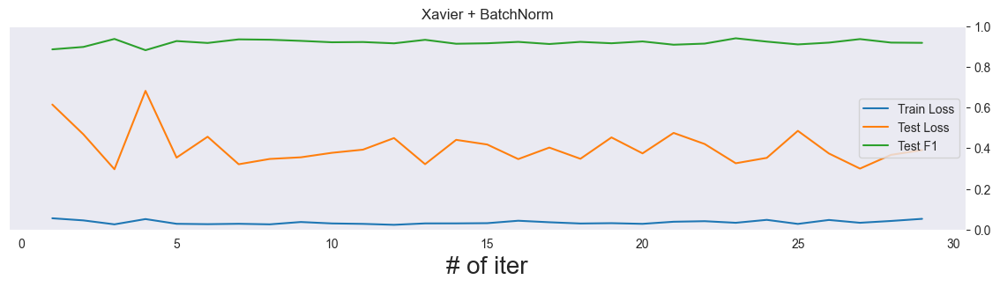

In [80]:
train_loss_history = []
test_loss_history = []
test_f1_history = []
for i in range(1, 30):
    train_dataset = TensorDataset(train_features_torch, train_target_torch)
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

    test_dataset = TensorDataset(test_features_torch, test_target_torch)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

    model = ResNetXavierBatchNorm(input_size=input_size, hidden_layers_size=64, num_layers=i, output_size=output_size).to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)

    print(f"Hidden layers: {i}")


    last_train_loss = None
    last_test_loss = None
    last_test_f1 = None
    for epoch in range(num_epochs):
        model.train()
        train_loss = 0
        for features, target in train_loader:
            optimizer.zero_grad()
            outputs = model(features)
            loss = criterion(outputs, target)
            loss.backward()
            optimizer.step()
            train_loss += loss.item()

        train_loss /= len(train_loader)

        model.eval()
        test_loss = 0
        all_preds = []
        all_targets = []

        with torch.no_grad():
            for features, target in test_loader:
                outputs = model(features)
                loss = criterion(outputs, target)
                test_loss += loss.item()

                preds = torch.argmax(outputs, dim=1)
                all_preds.extend(preds.cpu().numpy())
                all_targets.extend(target.cpu().numpy())

        test_loss /= len(test_loader)
        test_f1 = f1_score(all_targets, all_preds, average='weighted')

        last_train_loss = train_loss
        last_test_loss = test_loss
        last_test_f1 = test_f1
        print(
            f"Epoch {epoch + 1}/{num_epochs}, Train Loss: {train_loss:.4f}, Test Loss: {test_loss:.4f}, Test F1 Score: {test_f1:.4f}")
    train_loss_history.append(last_train_loss)
    test_loss_history.append(last_test_loss)
    test_f1_history.append(last_test_f1)
visualize_descent(train_loss_history, test_loss_history, test_f1_history, title=f"Xavier + BatchNorm")

![](data/resnet-xavier-batchnorm-default.png)

ResNet с Xavier и BatchNorm преодолел моральную границу в 0.9 F1

## Прореживание + дообучение

Epoch 1/450, Train Loss: 2616.7189, Test Loss: 1467.5119, Test F1 Score: 0.3729
Epoch 2/450, Train Loss: 1247.1792, Test Loss: 638.9556, Test F1 Score: 0.4713
Epoch 3/450, Train Loss: 329.8269, Test Loss: 613.1516, Test F1 Score: 0.0200
Epoch 4/450, Train Loss: 256.5190, Test Loss: 295.9659, Test F1 Score: 0.4784
Epoch 5/450, Train Loss: 263.8821, Test Loss: 211.2184, Test F1 Score: 0.4654
Epoch 6/450, Train Loss: 147.8954, Test Loss: 86.4584, Test F1 Score: 0.5760
Epoch 7/450, Train Loss: 71.0244, Test Loss: 74.1439, Test F1 Score: 0.4905
Epoch 8/450, Train Loss: 42.9141, Test Loss: 33.5353, Test F1 Score: 0.6968
Epoch 9/450, Train Loss: 38.5502, Test Loss: 55.7503, Test F1 Score: 0.2387
Epoch 10/450, Train Loss: 43.2146, Test Loss: 25.9729, Test F1 Score: 0.6977
Epoch 11/450, Train Loss: 25.3341, Test Loss: 20.9819, Test F1 Score: 0.6996
Epoch 12/450, Train Loss: 35.7691, Test Loss: 39.8739, Test F1 Score: 0.5706
Epoch 13/450, Train Loss: 24.2197, Test Loss: 22.7000, Test F1 Score: 0

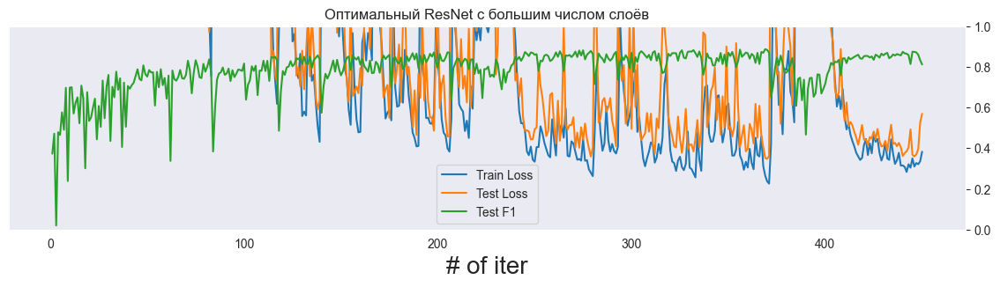

In [81]:
train_loss_history = []
test_loss_history = []
test_f1_history = []

train_dataset = TensorDataset(train_features_torch, train_target_torch)
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

test_dataset = TensorDataset(test_features_torch, test_target_torch)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

model = ResNetXavier(input_size=input_size, hidden_layers_size=64, num_layers=16, output_size=output_size).to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=learning_rate)

num_epochs = 450

train_loss_history = []
test_loss_history = []
test_f1_history = []
for epoch in range(num_epochs):
    model.train()
    train_loss = 0
    for features, target in train_loader:
        optimizer.zero_grad()
        outputs = model(features)
        loss = criterion(outputs, target)
        loss.backward()
        optimizer.step()
        train_loss += loss.item()
    
    train_loss /= len(train_loader)
    
    model.eval()
    test_loss = 0
    all_preds = []
    all_targets = []
    
    with torch.no_grad():
        for features, target in test_loader:
            outputs = model(features)
            loss = criterion(outputs, target)
            test_loss += loss.item()
            
            preds = torch.argmax(outputs, dim=1)
            all_preds.extend(preds.cpu().numpy())
            all_targets.extend(target.cpu().numpy())
    
    test_loss /= len(test_loader)
    test_f1 = f1_score(all_targets, all_preds, average='weighted')
    
    train_loss_history.append(train_loss)
    test_loss_history.append(test_loss)
    test_f1_history.append(test_f1)
    print(f"Epoch {epoch+1}/{num_epochs}, Train Loss: {train_loss:.4f}, Test Loss: {test_loss:.4f}, Test F1 Score: {test_f1:.4f}")
visualize_descent(train_loss_history, test_loss_history, test_f1_history, title=f"Оптимальный ResNet с большим числом слоёв")

In [82]:
layer_means = []
with torch.no_grad():
    model.eval()
    for inputs, _ in train_loader:
        inputs = inputs.to(device)
        x = model.input_layer(inputs)
        x = model.relu(x)
        
        for i, layer in enumerate(model.layers):  # Проход по всем резидуал слоям
            x = layer(x)
            mean_value = x.mean().item()
            if len(layer_means) <= i:
                layer_means.append(mean_value)
            else:
                layer_means[i] += mean_value

# Среднее значение для каждого слоя
layer_means = [(idx, mean / len(train_loader)) for idx, mean in enumerate(layer_means)]

layer_means.sort(key=lambda x: x[1], reverse=False)

print(layer_means)


[(7, 61.81104564666748), (8, 66.00986671447754), (6, 67.25867652893066), (9, 77.99822807312012), (5, 85.40891456604004), (10, 87.85811614990234), (11, 104.15246391296387), (4, 116.45099258422852), (12, 118.61469078063965), (3, 125.0766487121582), (13, 133.0008773803711), (14, 163.15575790405273), (2, 171.56824111938477), (1, 184.16335678100586), (15, 204.53054428100586), (0, 216.08916854858398)]


In [83]:
# Создание новой модели без слоя с наименьшей средней величиной
class FineTunedResNet(nn.Module):
    def __init__(self, original_model, remove_layer_idx):
        super(FineTunedResNet, self).__init__()
        self.input_layer = original_model.input_layer
        self.relu = nn.ReLU(inplace=True)
        self.layers = nn.Sequential(
            *[layer for i, layer in enumerate(original_model.layers) if i not in remove_layer_idx]
        )
        self.output_layer = original_model.output_layer

    def forward(self, x):
        x = self.input_layer(x)
        x = self.relu(x)
        x = self.layers(x)
        x = self.output_layer(x)
        return x

fine_tuned_model = FineTunedResNet(model, list(map(lambda i: i[0], layer_means[:4]))).to(device)
optimizer = optim.Adam(fine_tuned_model.parameters(), lr=learning_rate)

Дообучение модифицированной модели

Epoch 1/100, Train Loss: 130.2159, Test Loss: 62.7187, Test F1 Score: 0.3771
Epoch 2/100, Train Loss: 59.9494, Test Loss: 46.7171, Test F1 Score: 0.6089
Epoch 3/100, Train Loss: 45.0663, Test Loss: 24.3440, Test F1 Score: 0.6245
Epoch 4/100, Train Loss: 20.8395, Test Loss: 18.2266, Test F1 Score: 0.3029
Epoch 5/100, Train Loss: 12.0134, Test Loss: 8.7919, Test F1 Score: 0.6204
Epoch 6/100, Train Loss: 6.6388, Test Loss: 5.8352, Test F1 Score: 0.6329
Epoch 7/100, Train Loss: 4.5794, Test Loss: 3.6059, Test F1 Score: 0.7375
Epoch 8/100, Train Loss: 3.4672, Test Loss: 2.9226, Test F1 Score: 0.7093
Epoch 9/100, Train Loss: 2.5176, Test Loss: 3.6957, Test F1 Score: 0.5217
Epoch 10/100, Train Loss: 6.6435, Test Loss: 2.6332, Test F1 Score: 0.7711
Epoch 11/100, Train Loss: 4.9264, Test Loss: 6.6785, Test F1 Score: 0.6516
Epoch 12/100, Train Loss: 5.3784, Test Loss: 2.7597, Test F1 Score: 0.7529
Epoch 13/100, Train Loss: 3.5404, Test Loss: 3.7581, Test F1 Score: 0.6728
Epoch 14/100, Train Loss

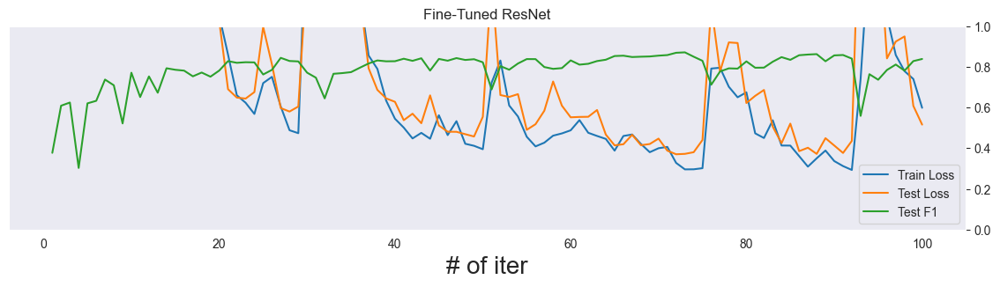

In [84]:
num_epochs_finetune = 100

train_loss_history = []
test_loss_history = []
test_f1_history = []
for epoch in range(num_epochs_finetune):
    fine_tuned_model.train()
    train_loss = 0
    for inputs, targets in train_loader:
        inputs, targets = inputs.to(device), targets.to(device)
        
        optimizer.zero_grad()
        outputs = fine_tuned_model(inputs)
        loss = criterion(outputs, targets)
        loss.backward()
        optimizer.step()
        train_loss += loss.item()
    
    train_loss /= len(train_loader)
    
    fine_tuned_model.eval()
    test_loss = 0
    all_preds = []
    all_targets = []
    
    with torch.no_grad():
        for features, target in test_loader:
            outputs = fine_tuned_model(features)
            loss = criterion(outputs, target)
            test_loss += loss.item()
            
            preds = torch.argmax(outputs, dim=1)
            all_preds.extend(preds.cpu().numpy())
            all_targets.extend(target.cpu().numpy())
    
    test_loss /= len(test_loader)
    test_f1 = f1_score(all_targets, all_preds, average='weighted')
    
    train_loss_history.append(train_loss)
    test_loss_history.append(test_loss)
    test_f1_history.append(test_f1)
    print(f"Epoch {epoch+1}/{num_epochs_finetune}, Train Loss: {train_loss:.4f}, Test Loss: {test_loss:.4f}, Test F1 Score: {test_f1:.4f}")
visualize_descent(train_loss_history, test_loss_history, test_f1_history, title=f"Fine-Tuned ResNet")

In [85]:
torch.save(fine_tuned_model.state_dict(), 'models/finetuned_resnet_model.pt')

## Обучение этой же модели, но с нуля

Epoch 1/550, Train Loss: 3855.9148, Test Loss: 517.6116, Test F1 Score: 0.6132
Epoch 2/550, Train Loss: 522.9058, Test Loss: 266.8412, Test F1 Score: 0.4622
Epoch 3/550, Train Loss: 295.7424, Test Loss: 350.5220, Test F1 Score: 0.5821
Epoch 4/550, Train Loss: 292.9945, Test Loss: 431.1812, Test F1 Score: 0.0682
Epoch 5/550, Train Loss: 225.7414, Test Loss: 386.0633, Test F1 Score: 0.2262
Epoch 6/550, Train Loss: 214.5284, Test Loss: 138.9299, Test F1 Score: 0.4908
Epoch 7/550, Train Loss: 160.5490, Test Loss: 122.4836, Test F1 Score: 0.6146
Epoch 8/550, Train Loss: 113.6449, Test Loss: 136.9496, Test F1 Score: 0.4657
Epoch 9/550, Train Loss: 104.4132, Test Loss: 92.4686, Test F1 Score: 0.5816
Epoch 10/550, Train Loss: 115.4797, Test Loss: 105.5644, Test F1 Score: 0.5297
Epoch 11/550, Train Loss: 125.2650, Test Loss: 128.6052, Test F1 Score: 0.6356
Epoch 12/550, Train Loss: 134.5765, Test Loss: 125.1870, Test F1 Score: 0.4272
Epoch 13/550, Train Loss: 93.9952, Test Loss: 60.4345, Test F

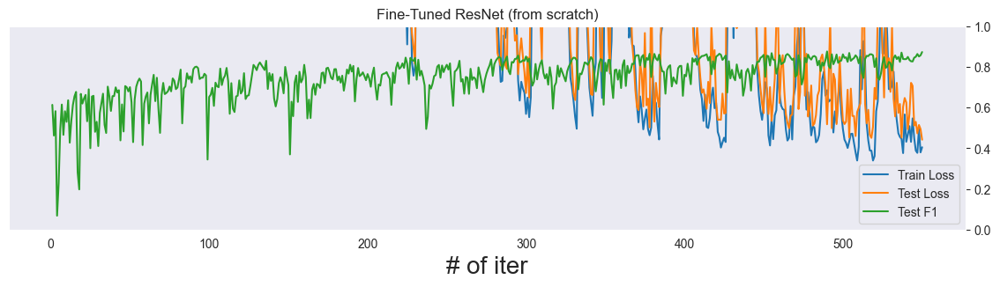

In [86]:
fine_tuned_model = FineTunedResNet(ResNetXavier(input_size=input_size, hidden_layers_size=64, num_layers=16, output_size=output_size).to(device), list(map(lambda i: i[0], layer_means[:4]))).to(device)

num_epochs_finetune = 450 + 100
optimizer = optim.Adam(fine_tuned_model.parameters(), lr=learning_rate)

train_loss_history = []
test_loss_history = []
test_f1_history = []
for epoch in range(num_epochs_finetune):
    fine_tuned_model.train()
    train_loss = 0
    for inputs, targets in train_loader:
        inputs, targets = inputs.to(device), targets.to(device)
        
        optimizer.zero_grad()
        outputs = fine_tuned_model(inputs)
        loss = criterion(outputs, targets)
        loss.backward()
        optimizer.step()
        train_loss += loss.item()
    
    train_loss /= len(train_loader)
    
    fine_tuned_model.eval()
    test_loss = 0
    all_preds = []
    all_targets = []
    
    with torch.no_grad():
        for features, target in test_loader:
            outputs = fine_tuned_model(features)
            loss = criterion(outputs, target)
            test_loss += loss.item()
            
            preds = torch.argmax(outputs, dim=1)
            all_preds.extend(preds.cpu().numpy())
            all_targets.extend(target.cpu().numpy())
    
    test_loss /= len(test_loader)
    test_f1 = f1_score(all_targets, all_preds, average='weighted')
    
    train_loss_history.append(train_loss)
    test_loss_history.append(test_loss)
    test_f1_history.append(test_f1)
    print(f"Epoch {epoch+1}/{num_epochs_finetune}, Train Loss: {train_loss:.4f}, Test Loss: {test_loss:.4f}, Test F1 Score: {test_f1:.4f}")
visualize_descent(train_loss_history, test_loss_history, test_f1_history, title=f"Fine-Tuned ResNet (from scratch)")